# Correlations before and after attack
## Using the Kendall correlation scheme

Example: one new qcd file

Always using the same scale (-1,1) for the correlations

ToDo: with the old datasets; abs(...); how to deal with defaults in the attacks; apply for scaled inputs instead of scaled-back inputs

## Preparations

### Loading modules

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import mplhep as hep
import uproot4 as uproot

In [4]:
import torch
import torch.nn as nn

from sklearn import metrics
from sklearn.preprocessing import StandardScaler

### Configure the device

In [5]:
#device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
device = torch.device("cpu")

### Plot styling

In [6]:
plt.style.use([hep.style.ROOT, hep.style.firamath])

### Opening the files

##### First one of the new set of QCD files

In [7]:
#file = "root://grid-cms-xrootd.physik.rwth-aachen.de:1094//store/user/anovak/PFNano/106X_v2_17/QCD_HT1000to1500_TuneCP5_13TeV-madgraph-pythia8/RunIIFall17PFNanoAODv2-PU2017_12Apr2018_94X_mc2017_realistic_v14-v1PFNanoV2/210101_173148/0001/nano_mc2017_1-1048.root"

Now also available locally

In [8]:
file = "/home/um106329/aisafety/information_datasets/nano_mc2017_1-1048.root"

In [9]:
tree = uproot.open(file, library='pd')['Events']
#tree.keys()

## Create dataframe, do some cleaning

In [10]:
jet_input_branches = ["event", "Jet_pt","Jet_eta", "Jet_hadronFlavour", "Jet_nBHadrons", "Jet_btagDeepB", "Jet_btagDeepFlavB"]
deepCSV_input_branches = [x for x in tree.keys() if 'Jet_DeepCSV' in x]
jet_input_branches.extend(deepCSV_input_branches)
deepCSV_input_branches = ["Jet_pt", "Jet_eta"] + deepCSV_input_branches

In [11]:
df = tree.arrays(jet_input_branches, library='pd')
df.unstack()
df

event      Jet_pt   Jet_eta  Jet_hadronFlavour  \
entry subentry                                                       
0     0          76071929  671.500000 -0.122818                  0   
      1          76071929  448.500000  0.105759                  0   
      2          76071929  270.750000 -0.360352                  0   
      3          76071929   41.687500 -0.462341                  0   
1     0          76071845  400.750000 -0.002752                  0   
...                   ...         ...       ...                ...   
7738  4         174676315   27.671875  2.825684                  0   
      5         174676315   23.281250 -2.705078                  0   
      6         174676315   20.093750  0.387329                  0   
      7         174676315   19.109375 -3.816406                  0   
      8         174676315   16.796875 -1.479736                  0   

                Jet_nBHadrons  Jet_btagDeepB  Jet_btagDeepFlavB  \
entry subentry                                                    
0     0                     0       0.112854           0.086853   
      1                     0       0.030960           0.021286   
      2                     0       0.048584           0.020294   
      3                     0       0.071228           0.332520   
1     0                     0       0.025467           0.014442   
...                       ...            ...                ...   
7738  4                     0      -1.000000           0.207275   
      5                     0       0.194458           0.283691   
      6                     0      -1.000000           0.041840   
      7                     0      -1.000000           0.192505   
      8                     0       0.137573           0.104614   

                Jet_DeepCSV_flightDistance2dSig  \
entry subentry                                    
0     0                               20.640625   
      1                             -999.000000   
      2                                3.375000   
      3                                4.468750   
1     0                             -999.000000   
...                                         ...   
7738  4                             -999.000000   
      5                             -999.000000   
      6                             -999.000000   
      7                             -999.000000   
      8                             -999.000000   

                Jet_DeepCSV_flightDistance2dVal  \
entry subentry                                    
0     0                                1.925781   
      1                             -999.000000   
      2                                0.131958   
      3                                0.060944   
1     0                             -999.000000   
...                                         ...   
7738  4                             -999.000000   
      5                             -999.000000   
      6                             -999.000000   
      7                             -999.000000   
      8                             -999.000000   

                Jet_DeepCSV_flightDistance3dSig  ...  \
entry subentry                                   ...   
0     0                               20.671875  ...   
      1                             -999.000000  ...   
      2                                3.345703  ...   
      3                                4.500000  ...   
1     0                             -999.000000  ...   
...                                         ...  ...   
7738  4                             -999.000000  ...   
      5                             -999.000000  ...   
      6                             -999.000000  ...   
      7                             -999.000000  ...   
      8                             -999.000000  ...   

                Jet_DeepCSV_trackSumJetDeltaR  Jet_DeepCSV_trackSumJetEtRatio  \
entry subentry                                                                  
0     0           

### (0'th cleaning step: cuts on Jet Pt and Jet Eta)


In [12]:
df = df[(df['Jet_pt']>25) & (abs(df['Jet_eta'])<2.5)]

In [13]:
df = df.reset_index()

### Cleaning of the deepCSV inputs
based on NaN or infinities

In [14]:
pd.options.mode.use_inf_as_na = False

In [15]:
df[deepCSV_input_branches]

,Jet_pt,Jet_eta,Jet_DeepCSV_flightDistance2dSig,Jet_DeepCSV_flightDistance2dVal,Jet_DeepCSV_flightDistance3dSig,Jet_DeepCSV_flightDistance3dVal,Jet_DeepCSV_trackDecayLenVal_0,Jet_DeepCSV_trackDecayLenVal_1,Jet_DeepCSV_trackDecayLenVal_2,Jet_DeepCSV_trackDecayLenVal_3,...,Jet_DeepCSV_trackSumJetDeltaR,Jet_DeepCSV_trackSumJetEtRatio,Jet_DeepCSV_vertexCategory,Jet_DeepCSV_vertexEnergyRatio,Jet_DeepCSV_vertexJetDeltaR,Jet_DeepCSV_vertexMass,Jet_DeepCSV_jetNSecondaryVertices,Jet_DeepCSV_jetNSelectedTracks,Jet_DeepCSV_jetNTracksEtaRel,Jet_DeepCSV_vertexNTracks
0,671.50000,-0.122818,20.640625,1.925781,20.671875,2.015625,0.040619,0.002913,2.525330e-03,3.137207e-02,...,0.015335,0.459961,0.0,0.014397,0.187744,0.617188,1,14,2,2
1,448.50000,0.105759,-999.000000,-999.000000,-999.000000,-999.000000,0.173706,0.027267,6.683350e-03,9.315491e-03,...,0.005322,0.380615,2.0,-999.000000,-999.000000,-999.000000,0,9,0,0
2,270.75000,-0.360352,3.375000,0.131958,3.345703,0.137939,0.030930,0.011078,9.832764e-02,7.708740e-02,...,0.004868,0.499512,0.0,0.140747,0.066162,1.732422,1,4,4,4
3,41.68750,-0.462341,4.468750,0.060944,4.500000,0.067749,0.056519,0.003979,6.580353e-03,8.062744e-02,...,0.181763,4.453125,0.0,0.236938,0.072998,5.492188,2,7,4,4
4,400.75000,-0.002752,-999.000000,-999.000000,-999.000000,-999.000000,0.022736,0.052002,8.468628e-03,6.362915e-03,...,0.013580,0.711426,1.0,0.029877,0.102783,0.333496,0,14,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34474,121.81250,1.252441,-999.000000,-999.000000,-999.000000,-999.000000,0.034302,0.000334,2.838135e-02,4.959106e-02,...,0.004467,0.540527,2.0,-999.000000,-999.000000,-999.000000,0,6,0,0
34475,56.59375,0.584351,2.384766,0.013908,2.455078,0.016937,0.008575,0.027359,9.737015e-04,6.614685e-03,...,0.019012,0.599609,0.0,0.524414,0.275391,5.261719,1,7,4,4
34476,554.50000,1.015625,-999.000000,-999.000000,-999.000000,-999.000000,0.684082,0.006989,2.350989e-38,1.447557e-38,...,0.004997,0.146362,2.0,-999.000000,-999.000000,-999.000000,0,2,0,0
34477,409.50000,-0.570190,2.705078,0.068420,2.736328,0.079041,0.051300,0.045319,1.351166e-02,2.285767e-02,...,0.007549,0.494385,0.0,0.559570,0.036346,5.527344,1,9,7,7


In [16]:
# Typical uncleaned data
df['Jet_DeepCSV_trackDecayLenVal_4'].describe()

count    3.380600e+04
mean              inf
std               inf
min     -1.701412e+38
25%      2.756192e-24
50%      1.498413e-02
75%      6.048584e-02
max      6.812293e+37
Name: Jet_DeepCSV_trackDecayLenVal_4, dtype: float64

In [17]:
pd.options.mode.use_inf_as_na = True

In [18]:
df['Jet_DeepCSV_trackDecayLenVal_4'].describe()

count    3.380600e+04
mean              NaN
std               NaN
min     -1.701412e+38
25%      2.756192e-24
50%      1.498413e-02
75%      6.048584e-02
max      6.812293e+37
Name: Jet_DeepCSV_trackDecayLenVal_4, dtype: float64

In [19]:
df[deepCSV_input_branches].isna().mean().tolist()

[0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.005916644914295658,
 0.0034513762000058005,
 0.019519127584906756,
 0.01592273557817802,
 0.0,
 0.0,
 0.005916644914295658,
 0.0034513762000058005,
 0.019519127584906756,
 0.01592273557817802,
 0.0,
 0.0,
 0.008236897821862583,
 0.004263464717654224,
 0.0,
 0.0,
 0.005916644914295658,
 0.0034513762000058005,
 0.019519127584906756,
 0.01592273557817802,
 0.0,
 0.0,
 0.0,
 0.005916644914295658,
 0.0034513762000058005,
 0.019519127584906756,
 0.01592273557817802,
 0.0,
 0.0,
 0.005916644914295658,
 0.0034513762000058005,
 0.019519127584906756,
 0.01592273557817802,
 0.0,
 0.0,
 0.0,
 0.005916644914295658,
 0.0034513762000058005,
 0.019519127584906756,
 0.01592273557817802,
 0.0,
 0.0,
 0.0,
 0.0,
 0.005916644914295658,
 0.0034513762000058005,
 0.019519127584906756,
 0.01592273557817802,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0]

In [20]:
df = df.fillna(-999)

In [21]:
df[deepCSV_input_branches].isna().mean().tolist()

[0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0]

In [22]:
df = df.applymap(lambda x: -999 if x < -999 else x)
df = df.applymap(lambda x: -999 if x > 1000 else x)

In [23]:
df.describe()

,entry,subentry,event,Jet_pt,Jet_eta,Jet_hadronFlavour,Jet_nBHadrons,Jet_btagDeepB,Jet_btagDeepFlavB,Jet_DeepCSV_flightDistance2dSig,...,Jet_DeepCSV_trackSumJetDeltaR,Jet_DeepCSV_trackSumJetEtRatio,Jet_DeepCSV_vertexCategory,Jet_DeepCSV_vertexEnergyRatio,Jet_DeepCSV_vertexJetDeltaR,Jet_DeepCSV_vertexMass,Jet_DeepCSV_jetNSecondaryVertices,Jet_DeepCSV_jetNSelectedTracks,Jet_DeepCSV_jetNTracksEtaRel,Jet_DeepCSV_vertexNTracks
count,34479.000000,34479.000000,34479.0,34479.000000,34479.000000,34479.000000,34479.000000,34479.000000,34479.000000,34479.000000,...,34479.000000,34479.000000,34479.000000,34479.000000,34479.000000,34479.000000,34479.000000,34479.000000,34479.000000,34479.000000
mean,-807.438412,2.110009,-999.0,252.722607,0.001081,0.541518,0.051046,0.089139,0.085073,-652.797305,...,-2.725652,-2.248688,-1.512979,-615.908165,-616.007912,-613.411867,0.426811,6.698106,1.522492,1.522492
std,510.832587,1.846789,0.0,203.935091,1.154646,1.438335,0.269285,0.216921,0.187782,480.054822,...,52.644612,52.669709,52.716463,485.897970,485.771146,489.117390,0.673882,3.769532,2.435908,2.435908
min,-999.000000,0.000000,-999.0,25.015625,-2.499023,0.000000,0.000000,-1.000000,0.001214,-999.000000,...,-999.000000,-999.000000,-999.000000,-999.000000,-999.000000,-999.000000,0.000000,0.000000,0.000000,0.000000
25%,-999.000000,1.000000,-999.0,56.953125,-0.874878,0.000000,0.000000,0.026764,0.008636,-999.000000,...,0.008751,0.395996,0.000000,-999.000000,-999.000000,-999.000000,0.000000,4.000000,0.000000,0.000000
50%,-999.000000,2.000000,-999.0,192.625000,0.003799,0.000000,0.000000,0.046722,0.017990,-999.000000,...,0.018448,0.538574,2.000000,-999.000000,-999.000000,-999.000000,0.000000,6.000000,0.000000,0.000000
75%,-999.000000,3.000000,-999.0,443.250000,0.877075,0.000000,0.000000,0.103394,0.055084,3.038086,...,0.039597,0.672852,2.000000,0.178589,0.055542,1.932617,1.000000,9.000000,2.000000,2.000000
max,1000.000000,13.000000,-999.0,867.500000,2.499512,5.000000,4.000000,0.999512,0.999512,780.000000,...,3.912109,4.910156,2.000000,79.875000,0.300049,183.750000,7.000000,26.000000,25.000000,25.000000


## So far:
Defaults have been given the value -999 (if they were <-999 or >1000 or Nan or +-inf).
Now, these defaults will be shifted

#### Default = -10

In [24]:
default_val = -10

In [25]:
df = df.applymap(lambda x: default_val if (x == -999) else x)

## Applying the attack

The inputs have to be prepared, cleaning is considered "done". But in order to use the attack, the inputs shall be scaled by (x-mu)/sigma.
Besides that, we need the true target classes, otherwise calculations involving the loss function (fgsm) would fail.
And in order to use the correct model, it has to be loaded together with the criterion & optimizer.

### Names to identify the variables, to display them in plots

In [26]:
input_names = ['Jet_eta', 'Jet_pt',
 'Jet_DeepCSV_flightDistance2dSig', 'Jet_DeepCSV_flightDistance2dVal', 'Jet_DeepCSV_flightDistance3dSig', 'Jet_DeepCSV_flightDistance3dVal',
 'Jet_DeepCSV_trackDecayLenVal_0', 'Jet_DeepCSV_trackDecayLenVal_1', 'Jet_DeepCSV_trackDecayLenVal_2', 'Jet_DeepCSV_trackDecayLenVal_3', 'Jet_DeepCSV_trackDecayLenVal_4', 'Jet_DeepCSV_trackDecayLenVal_5',
 'Jet_DeepCSV_trackDeltaR_0', 'Jet_DeepCSV_trackDeltaR_1', 'Jet_DeepCSV_trackDeltaR_2', 'Jet_DeepCSV_trackDeltaR_3', 'Jet_DeepCSV_trackDeltaR_4', 'Jet_DeepCSV_trackDeltaR_5',
 'Jet_DeepCSV_trackEtaRel_0', 'Jet_DeepCSV_trackEtaRel_1', 'Jet_DeepCSV_trackEtaRel_2', 'Jet_DeepCSV_trackEtaRel_3',
 'Jet_DeepCSV_trackJetDistVal_0', 'Jet_DeepCSV_trackJetDistVal_1', 'Jet_DeepCSV_trackJetDistVal_2', 'Jet_DeepCSV_trackJetDistVal_3', 'Jet_DeepCSV_trackJetDistVal_4', 'Jet_DeepCSV_trackJetDistVal_5',
 'Jet_DeepCSV_trackJetPt',
 'Jet_DeepCSV_trackPtRatio_0', 'Jet_DeepCSV_trackPtRatio_1', 'Jet_DeepCSV_trackPtRatio_2', 'Jet_DeepCSV_trackPtRatio_3', 'Jet_DeepCSV_trackPtRatio_4', 'Jet_DeepCSV_trackPtRatio_5',
 'Jet_DeepCSV_trackPtRel_0', 'Jet_DeepCSV_trackPtRel_1', 'Jet_DeepCSV_trackPtRel_2', 'Jet_DeepCSV_trackPtRel_3', 'Jet_DeepCSV_trackPtRel_4', 'Jet_DeepCSV_trackPtRel_5',
 'Jet_DeepCSV_trackSip2dSigAboveCharm',
 'Jet_DeepCSV_trackSip2dSig_0', 'Jet_DeepCSV_trackSip2dSig_1', 'Jet_DeepCSV_trackSip2dSig_2', 'Jet_DeepCSV_trackSip2dSig_3', 'Jet_DeepCSV_trackSip2dSig_4', 'Jet_DeepCSV_trackSip2dSig_5',
 'Jet_DeepCSV_trackSip2dValAboveCharm',
 'Jet_DeepCSV_trackSip3dSigAboveCharm',
 'Jet_DeepCSV_trackSip3dSig_0', 'Jet_DeepCSV_trackSip3dSig_1', 'Jet_DeepCSV_trackSip3dSig_2', 'Jet_DeepCSV_trackSip3dSig_3', 'Jet_DeepCSV_trackSip3dSig_4', 'Jet_DeepCSV_trackSip3dSig_5',
 'Jet_DeepCSV_trackSip3dValAboveCharm',
 'Jet_DeepCSV_trackSumJetDeltaR', 'Jet_DeepCSV_trackSumJetEtRatio',
 'Jet_DeepCSV_vertexCategory', 'Jet_DeepCSV_vertexEnergyRatio', 'Jet_DeepCSV_vertexJetDeltaR', 'Jet_DeepCSV_vertexMass',
 'Jet_DeepCSV_jetNSecondaryVertices', 'Jet_DeepCSV_jetNSelectedTracks', 'Jet_DeepCSV_jetNTracksEtaRel', 'Jet_DeepCSV_vertexNTracks',]

display_names = ['Jet $\eta$',
                'Jet $p_T$',
                'Flight Distance 2D Sig','Flight Distance 2D Val','Flight Distance 3D Sig', 'Flight Distance 3D Val',
                'Track Decay Len Val [0]','Track Decay Len Val [1]','Track Decay Len Val [2]','Track Decay Len Val [3]','Track Decay Len Val [4]','Track Decay Len Val [5]',
                'Track $\Delta R$ [0]','Track $\Delta R$ [1]','Track $\Delta R$ [2]','Track $\Delta R$ [3]','Track $\Delta R$ [4]','Track $\Delta R$ [5]',
                'Track $\eta_{rel}$ [0]','Track $\eta_{rel}$ [1]','Track $\eta_{rel}$ [2]','Track $\eta_{rel}$ [3]',
                'Track Jet Dist Val [0]','Track Jet Dist Val [1]','Track Jet Dist Val [2]','Track Jet Dist Val [3]','Track Jet Dist Val [4]','Track Jet Dist Val [5]',
                'Track Jet $p_T$',
                'Track $p_T$ Ratio [0]','Track $p_T$ Ratio [1]','Track $p_T$ Ratio [2]','Track $p_T$ Ratio [3]','Track $p_T$ Ratio [4]','Track $p_T$ Ratio [5]',
                'Track $p_{T,rel}$ [0]','Track $p_{T,rel}$ [1]','Track $p_{T,rel}$ [2]','Track $p_{T,rel}$ [3]','Track $p_{T,rel}$ [4]','Track $p_{T,rel}$ [5]',
                'Track SIP 2D Sig Above Charm',
                'Track SIP 2D Sig [0]','Track SIP 2D Sig [1]','Track SIP 2D Sig [2]','Track SIP 2D Sig [3]','Track SIP 2D Sig [4]','Track SIP 2D Sig [5]',
                'Track SIP 2D Val Above Charm',
                'Track SIP 3D Sig Above Charm',
                'Track SIP 3D Sig [0]','Track SIP 3D Sig [1]','Track SIP 3D Sig [2]','Track SIP 3D Sig [3]','Track SIP 3D Sig [4]','Track SIP 3D Sig [5]',
                'Track SIP 3D Val Above Charm',
                'Track Sum Jet $\Delta R$','Track Sum Jet $E_T$ Ratio',
                'Vertex Category','Vertex Energy Ratio','Vertex Jet $\Delta R$','Vertex Mass',
                'Jet N Secondary Vertices','Jet N Selected Tracks','Jet N Tracks $\eta_{rel}$','Vertex N Tracks',]

### Loading the model with all its additional properties
This is the newest, non-weighted model (fully trained after 120 epochs)

In [27]:
criterion = nn.CrossEntropyLoss()

model = nn.Sequential(nn.Linear(67, 100),
                      nn.ReLU(),
                      nn.Dropout(0.1),
                      nn.Linear(100, 100),
                      nn.ReLU(),
                      nn.Dropout(0.1),
                      nn.Linear(100, 100),
                      nn.ReLU(),
                      nn.Dropout(0.1),
                      nn.Linear(100, 100),
                      nn.ReLU(),
                      nn.Dropout(0.1),
                      nn.Linear(100, 100),
                      nn.ReLU(),
                      nn.Linear(100, 4),
                      nn.Softmax(dim=1))

checkpoint = torch.load(f'/home/um106329/aisafety/models/weighted/200_full_files_120_epochs_v13_GPU_weighted_as_is.pt', map_location=torch.device(device))
model.load_state_dict(checkpoint["model_state_dict"])

model.to(device)
model.eval()

Sequential(
  (0): Linear(in_features=67, out_features=100, bias=True)
  (1): ReLU()
  (2): Dropout(p=0.1, inplace=False)
  (3): Linear(in_features=100, out_features=100, bias=True)
  (4): ReLU()
  (5): Dropout(p=0.1, inplace=False)
  (6): Linear(in_features=100, out_features=100, bias=True)
  (7): ReLU()
  (8): Dropout(p=0.1, inplace=False)
  (9): Linear(in_features=100, out_features=100, bias=True)
  (10): ReLU()
  (11): Dropout(p=0.1, inplace=False)
  (12): Linear(in_features=100, out_features=100, bias=True)
  (13): ReLU()
  (14): Linear(in_features=100, out_features=4, bias=True)
  (15): Softmax(dim=1)
)

### Creating the true flavour class (target_class) as a new column for the dataframe
Using the definitions from my initial cleandataset function

In [28]:
df["target_class"] = np.full_like(df['Jet_hadronFlavour'], 3)
df["target_class"] = np.where(df['Jet_hadronFlavour'] == 4, 2, df["target_class"])
df["target_class"] = np.where(np.bitwise_and(df['Jet_hadronFlavour'] == 5, df['Jet_nBHadrons'] > 1), 1, df["target_class"])
df["target_class"] = np.where(np.bitwise_and(df['Jet_hadronFlavour'] == 5, df['Jet_nBHadrons'] <= 1), 0, df["target_class"])

And check that the column has been added correctly:

In [29]:
df.head()

,entry,subentry,event,Jet_pt,Jet_eta,Jet_hadronFlavour,Jet_nBHadrons,Jet_btagDeepB,Jet_btagDeepFlavB,Jet_DeepCSV_flightDistance2dSig,...,Jet_DeepCSV_trackSumJetEtRatio,Jet_DeepCSV_vertexCategory,Jet_DeepCSV_vertexEnergyRatio,Jet_DeepCSV_vertexJetDeltaR,Jet_DeepCSV_vertexMass,Jet_DeepCSV_jetNSecondaryVertices,Jet_DeepCSV_jetNSelectedTracks,Jet_DeepCSV_jetNTracksEtaRel,Jet_DeepCSV_vertexNTracks,target_class
0,0,0,-10,671.5000,-0.122818,0,0,0.112854,0.086853,20.640625,...,0.459961,0.0,0.014397,0.187744,0.617188,1,14,2,2,3
1,0,1,-10,448.5000,0.105759,0,0,0.030960,0.021286,-10.000000,...,0.380615,2.0,-10.000000,-10.000000,-10.000000,0,9,0,0,3
2,0,2,-10,270.7500,-0.360352,0,0,0.048584,0.020294,3.375000,...,0.499512,0.0,0.140747,0.066162,1.732422,1,4,4,4,3
3,0,3,-10,41.6875,-0.462341,0,0,0.071228,0.332520,4.468750,...,4.453125,0.0,0.236938,0.072998,5.492188,2,7,4,4,3
4,1,0,-10,400.7500,-0.002752,0,0,0.025467,0.014442,-10.000000,...,0.711426,1.0,0.029877,0.102783,0.333496,0,14,2,2,3


And just some quick checks to find out the unique values of the target_class and Jet N Selected Tracks. It looks like here the cleaning did not erase the 5 tracks bin, although there also happened to be a step where we got rid off all the large values. (Which was found to be the step erasing the 5 tracks bin from my older datasets).

In [30]:
df.target_class.unique()

array([3, 2, 0, 1])

In [31]:
df.Jet_DeepCSV_jetNSelectedTracks.unique()

array([14,  9,  4,  7, 10,  5,  6,  2, 12,  3,  1, 15,  8, 11, 13,  0, 17,
       16, 20, 19, 22, 18, 21, 24, 26, 23, 25])

In [32]:
targets = torch.Tensor(df["target_class"].to_numpy()).long()

In [33]:
targets

tensor([3, 3, 3,  ..., 3, 3, 3])

### Scaling the cleaned inputs

In [34]:
all_inputs = torch.Tensor(df[deepCSV_input_branches].values[:,0:67])
norm_inputs = all_inputs.clone().detach()

scalers = []
    
for i in range(0,67):
    scaler = StandardScaler().fit(all_inputs[:,i].reshape(-1,1))
    norm_inputs[:,i] = torch.Tensor(scaler.transform(all_inputs[:,i].reshape(-1,1)).reshape(1,-1))
    scalers.append(scaler)


Should now have: scaled inputs (norm_inputs), scalers ready to be used with pytorch

In [35]:
n_jets = len(norm_inputs)
n_jets

34479

This is the total number of jets remaining after the cleaning steps above.

### Definitions of the functions used for the attacks and plotting

In [36]:
def apply_noise(magn=None,offset=0,sample=norm_inputs):
    noise = torch.Tensor(np.random.normal(offset,magn,(len(sample),67)))
    xadv = sample + noise
    # exactly like for the reduced fgsm method, the noise should not affect the integer variables or manual defaults
    xadv[:,input_names.index('Jet_DeepCSV_jetNSecondaryVertices')] = sample[:,input_names.index('Jet_DeepCSV_jetNSecondaryVertices')]
    xadv[:,input_names.index('Jet_DeepCSV_vertexCategory')] = sample[:,input_names.index('Jet_DeepCSV_vertexCategory')]
    xadv[:,input_names.index('Jet_DeepCSV_jetNSelectedTracks')] = sample[:,input_names.index('Jet_DeepCSV_jetNSelectedTracks')]
    xadv[:,input_names.index('Jet_DeepCSV_jetNTracksEtaRel')] = sample[:,input_names.index('Jet_DeepCSV_jetNTracksEtaRel')]
    xadv[:,input_names.index('Jet_DeepCSV_vertexNTracks')] = sample[:,input_names.index('Jet_DeepCSV_vertexNTracks')]
    
    # the default values were placed at e.g. -10, so something close to -10 - (-10) will end up in a small interval around zero and should not be moved by the attack
    for i in range(67):
        defaults = abs(scalers[i].inverse_transform(sample[:,i].cpu()) - default_val) < 0.001   # "floating point error" --> allow some error margin
        if np.sum(defaults) != 0:
            for i in range(67):
                xadv[:,i][defaults] = sample[:,i][defaults]
            break
            
            
    # not sure about these ones, are they necessary here?
    '''
    for i in [41, 48, 49, 56]:
        defaults = abs(scalers[i].inverse_transform(sample[:,i].cpu()) + 1.0) < 0.001   # "floating point error" --> allow some error margin
        if np.sum(defaults) != 0:
            for i in [41, 48, 49, 56]:
                xadv[:,i][defaults] = sample[:,i][defaults]
            break
    vars_with_0_defaults = [6, 7, 8, 9, 10, 11]                 # trackDecayLenVal_0 to _5
    vars_with_0_defaults.extend([12, 13, 14, 15, 16, 17])       # trackDeltaR_0 to _5
    vars_with_0_defaults.extend([18, 19, 20, 21])               # trackEtaRel_0 to _3
    vars_with_0_defaults.extend([22, 23, 24, 25, 26, 27])       # trackJetDistVal_0 to _5
    vars_with_0_defaults.extend([29, 30, 31, 32, 33, 34])       # trackPtRatio_0 to _5
    vars_with_0_defaults.extend([35, 36, 37, 38, 39, 40])       # trackPtRel_0 to _5
    for i in vars_with_0_defaults:
        defaults = abs(scalers[i].inverse_transform(sample[:,i].cpu())) < 0.001   # "floating point error" --> allow some error margin
        if np.sum(defaults) != 0:
            for i in vars_with_0_defaults:
                xadv[:,i][defaults] = sample[:,i][defaults]
            break
    '''
    
    return xadv
      

In [37]:
def fgsm_attack(epsilon=1e-1,sample=norm_inputs,targets=targets,reduced=True,scalers=scalers):
    xadv = sample.clone().detach()
    
    # calculate the gradient of the model w.r.t. the *input* tensor:
    # first we tell torch that x should be included in grad computations
    xadv.requires_grad = True
    
    # then we just do the forward and backwards pass as usual:
    preds = model(xadv)
    loss = criterion(preds, targets.long()).mean()
    model.zero_grad()
    loss.backward()
    
    with torch.no_grad():
        #now we obtain the gradient of the input. It has the same dimensions as the tensor xadv, and it "points" in the direction of increasing loss values.
        dx = torch.sign(xadv.grad.detach())
        
        #so, we take a step in that direction!
        xadv += epsilon*torch.sign(dx)
        
        #remove the impact on selected variables. This is nessecary to avoid problems that occur otherwise in the input shapes.
        if reduced:
            #xadv[:,2] = sample[:,2]     # TagVarCSV_jetNSecondaryVertices
            xadv[:,input_names.index('Jet_DeepCSV_jetNSecondaryVertices')] = sample[:,input_names.index('Jet_DeepCSV_jetNSecondaryVertices')]
            #xadv[:,5] = sample[:,5]     # TagVarCSV_vertexCategory
            xadv[:,input_names.index('Jet_DeepCSV_vertexCategory')] = sample[:,input_names.index('Jet_DeepCSV_vertexCategory')]
            #xadv[:,10] = sample[:,10]   # TagVarCSV_jetNSelectedTracks
            xadv[:,input_names.index('Jet_DeepCSV_jetNSelectedTracks')] = sample[:,input_names.index('Jet_DeepCSV_jetNSelectedTracks')]
            #xadv[:,11] = sample[:,11]   # TagVarCSV_jetNTracksEtaRel
            xadv[:,input_names.index('Jet_DeepCSV_jetNTracksEtaRel')] = sample[:,input_names.index('Jet_DeepCSV_jetNTracksEtaRel')]
            #xadv[:,59] = sample[:,59]   # TagVarCSV_vertexNTracks
            xadv[:,input_names.index('Jet_DeepCSV_vertexNTracks')] = sample[:,input_names.index('Jet_DeepCSV_vertexNTracks')]
            #xadv[:,12:][sample[:,12:]==0] = 0   # TagVarCSVTrk_trackJetDistVal and so forth, but I have not set any variable to 0 manually during cleaning
            #xadv[:,input_names.index('Jet_DeepCSV_trackJetDistVal_0'):][sample[:,input_names.index('Jet_DeepCSV_trackJetDistVal_0'):] == 0] = 0
            
            
            # the default values were placed at e.g. -10, so something close to -10 - (-10) will end up in a small interval around zero and should not be moved by the attack
            for i in range(67):
                defaults = abs(scalers[i].inverse_transform(sample[:,i].cpu()) - default_val) < 0.001   # "floating point error" --> allow some error margin
                if np.sum(defaults) != 0:
                    for i in range(67):
                        xadv[:,i][defaults] = sample[:,i][defaults]
                    break

            
            
            for i in [41, 48, 49, 56]:
                defaults = abs(scalers[i].inverse_transform(sample[:,i].cpu()) + 1.0) < 0.001   # "floating point error" --> allow some error margin
                if np.sum(defaults) != 0:
                    for i in [41, 48, 49, 56]:
                        xadv[:,i][defaults] = sample[:,i][defaults]
                    break
            vars_with_0_defaults = [6, 7, 8, 9, 10, 11]                 # trackDecayLenVal_0 to _5
            vars_with_0_defaults.extend([12, 13, 14, 15, 16, 17])       # trackDeltaR_0 to _5
            vars_with_0_defaults.extend([18, 19, 20, 21])               # trackEtaRel_0 to _3
            vars_with_0_defaults.extend([22, 23, 24, 25, 26, 27])       # trackJetDistVal_0 to _5
            vars_with_0_defaults.extend([29, 30, 31, 32, 33, 34])       # trackPtRatio_0 to _5
            vars_with_0_defaults.extend([35, 36, 37, 38, 39, 40])       # trackPtRel_0 to _5
            for i in vars_with_0_defaults:
                defaults = abs(scalers[i].inverse_transform(sample[:,i].cpu())) < 0.001   # "floating point error" --> allow some error margin
                if np.sum(defaults) != 0:
                    for i in vars_with_0_defaults:
                        xadv[:,i][defaults] = sample[:,i][defaults]
                    break
        return xadv.detach()
  

In [38]:
def create_distorted_inputs(attack_mode=None,parameter=0):
    if attack_mode == "noise":
        xadv = apply_noise(parameter)
    else:
        xadv = fgsm_attack(parameter)
        
    xadv_scaled_back = np.zeros([n_jets,67])
    for prop in range(67):
        xadv_scaled_back[:,prop] = scalers[prop].inverse_transform(xadv[:,prop])
        
    xadv_df = pd.DataFrame(xadv_scaled_back, index=df[deepCSV_input_branches].index, columns=df[deepCSV_input_branches].columns)
    corr_xadv = xadv_df[deepCSV_input_branches].corr('kendall')
    arr_corr_xadv = corr_xadv.to_numpy()
    
    return xadv_df, corr_xadv, arr_corr_xadv

In [39]:
def create_raw_inputs():
    raw = df[deepCSV_input_branches]
    corr_raw = raw.corr('kendall')
    arr_corr_raw = corr_raw.to_numpy()
    
    return raw, corr_raw, arr_corr_raw

In [40]:
def plot_corr(attack_mode=None, parameter=None, corr=None, arr_corr=None):
    fig, ax = plt.subplots(figsize=(24, 18))
    #hep.cms.label(loc=0)

    hm = sns.heatmap(arr_corr, cbar=True, vmin=-1, vmax=1,
                     fmt='.2f', annot_kws={'size': 3}, annot=True, 
                     square=True, cmap=plt.cm.seismic)

    ticks = np.arange(corr.shape[0]) + 0.5
    ax.set_xticks(ticks)
    ax.set_xticklabels(corr.columns, rotation=90, fontsize=8)
    ax.set_yticks(ticks)
    ax.set_yticklabels(corr.index, rotation=360, fontsize=8)
    
    if attack_mode == None:
        ax.set_title(f'Correlation matrix (Kendall) with raw inputs')
    elif attack_mode == "noise":
        ax.set_title(f'Correlation matrix (Kendall) with noise ($\sigma={parameter}$)')
    else:
        ax.set_title(f'Correlation matrix (Kendall) after FGSM ($\epsilon={parameter}$)')

    plt.tight_layout()

In [56]:
def plot_abs_corr(attack_mode=None, parameter=None, corr=None, arr_corr=None):
    fig, ax = plt.subplots(figsize=(24, 18))
    #hep.cms.label(loc=0)

    hm = sns.heatmap(np.abs(arr_corr), cbar=True, vmin=0, vmax=1,
                     fmt='.2f', annot_kws={'size': 3}, annot=True, 
                     square=True, cmap=plt.cm.Reds)

    ticks = np.arange(corr.shape[0]) + 0.5
    ax.set_xticks(ticks)
    ax.set_xticklabels(corr.columns, rotation=90, fontsize=8)
    ax.set_yticks(ticks)
    ax.set_yticklabels(corr.index, rotation=360, fontsize=8)
    
    if attack_mode == None:
        ax.set_title(f'Absolute correlations (Kendall) with raw inputs')
    elif attack_mode == "noise":
        ax.set_title(f'Absolute correlations (Kendall) with noise ($\sigma={parameter}$)')
    else:
        ax.set_title(f'Absolute correlations (Kendall) after FGSM ($\epsilon={parameter}$)')

    plt.tight_layout()

In [42]:
def plot_diff_corr(attack_mode=None, parameter=None, corr=None, arr_corr=None):
    diff = arr_corr_raw - arr_corr
    
    fig, ax = plt.subplots(figsize=(24, 18))
    #hep.cms.label(loc=0)

    hm = sns.heatmap(diff, cbar=True, vmin=-1, vmax=1,
                     fmt='.2f', annot_kws={'size': 3}, annot=True, 
                     square=True, cmap=plt.cm.seismic)

    ticks = np.arange(corr.shape[0]) + 0.5
    ax.set_xticks(ticks)
    ax.set_xticklabels(corr.columns, rotation=90, fontsize=8)
    ax.set_yticks(ticks)
    ax.set_yticklabels(corr.index, rotation=360, fontsize=8)
    
    if attack_mode == "noise":
        ax.set_title(f'Difference between correlation matrix (Kendall) raw and with noise ($\sigma={parameter}$)')
    else:
        ax.set_title(f'Difference between correlation matrix (Kendall) before and after FGSM with $\epsilon={parameter}$')

    plt.tight_layout()

In [60]:
def plot_abs_diff_corr(attack_mode=None, parameter=None, corr=None, arr_corr=None):
    diff = np.abs(arr_corr_raw) - np.abs(arr_corr)
    
    fig, ax = plt.subplots(figsize=(24, 18))
    #hep.cms.label(loc=0)

    hm = sns.heatmap(diff, cbar=True, vmin=-1, vmax=1,
                     fmt='.2f', annot_kws={'size': 3}, annot=True, 
                     square=True, cmap=plt.cm.seismic)

    ticks = np.arange(corr.shape[0]) + 0.5
    ax.set_xticks(ticks)
    ax.set_xticklabels(corr.columns, rotation=90, fontsize=8)
    ax.set_yticks(ticks)
    ax.set_yticklabels(corr.index, rotation=360, fontsize=8)
    
    if attack_mode == "noise":
        ax.set_title(f'Difference between absolute correlations (Kendall) raw and with noise ($\sigma={parameter}$)')
    else:
        ax.set_title(f'Difference between absolute correlations (Kendall) before and after FGSM with $\epsilon={parameter}$')

    plt.tight_layout()

In [64]:
def plot_diff_abs_corr(attack_mode=None, parameter=None, corr=None, arr_corr=None):
    diff = np.abs(arr_corr_raw - arr_corr)
    
    fig, ax = plt.subplots(figsize=(24, 18))
    #hep.cms.label(loc=0)

    hm = sns.heatmap(diff, cbar=True, vmin=0, vmax=1,
                     fmt='.2f', annot_kws={'size': 3}, annot=True, 
                     square=True, cmap=plt.cm.Reds)

    ticks = np.arange(corr.shape[0]) + 0.5
    ax.set_xticks(ticks)
    ax.set_xticklabels(corr.columns, rotation=90, fontsize=8)
    ax.set_yticks(ticks)
    ax.set_yticklabels(corr.index, rotation=360, fontsize=8)
    
    if attack_mode == "noise":
        ax.set_title(f'Absolute difference between correlations (Kendall) raw and with noise ($\sigma={parameter}$)')
    else:
        ax.set_title(f'Absolute difference between correlations (Kendall) before and after FGSM with $\epsilon={parameter}$')

    plt.tight_layout()

In [43]:
def plot_rel_diff_corr(attack_mode=None, parameter=None, corr=None, arr_corr=None):
    rel_diff = (arr_corr_raw - arr_corr) / arr_corr_raw
    
    fig, ax = plt.subplots(figsize=(24, 18))
    #hep.cms.label(loc=0)

    hm = sns.heatmap(rel_diff, cbar=True, vmin=-1, vmax=1,
                     fmt='.2f', annot_kws={'size': 3}, annot=True, 
                     square=True, cmap=plt.cm.seismic)

    ticks = np.arange(corr.shape[0]) + 0.5
    ax.set_xticks(ticks)
    ax.set_xticklabels(corr.columns, rotation=90, fontsize=8)
    ax.set_yticks(ticks)
    ax.set_yticklabels(corr.index, rotation=360, fontsize=8)
    
    if attack_mode == "noise":
        ax.set_title(f'Rel. difference between correlation matrix (Kendall) raw and with noise ($\sigma={parameter}$)')
    else:
        ax.set_title(f'Rel. difference between correlation matrix (Kendall) before and after FGSM with $\epsilon={parameter}$')

    plt.tight_layout()

### Generate correlation matrices with undisturbed and disturbed inputs
... create dataframe containing the inputs, create correlations (also as dataframe), create array with correlations

Notice that although the attacks have been performed on scaled inputs ((x-mu)/sigma), the correlations were calculated from the "original" scale (after transforming them back).

A next step might do all these with the scaled inputs during the whole process.

In [44]:
raw, corr_raw, arr_corr_raw = create_raw_inputs()

In [45]:
xadv_df_noise_005, corr_xadv_noise_005, arr_corr_xadv_noise_005 = create_distorted_inputs(attack_mode="noise",parameter=0.05)

xadv_df_noise_01,  corr_xadv_noise_01,  arr_corr_xadv_noise_01  = create_distorted_inputs(attack_mode="noise",parameter=0.1)

xadv_df_noise_02,  corr_xadv_noise_02,  arr_corr_xadv_noise_02  = create_distorted_inputs(attack_mode="noise",parameter=0.2)

In [46]:
xadv_df_fgsm_0005, corr_xadv_fgsm_0005, arr_corr_xadv_fgsm_0005 = create_distorted_inputs(attack_mode="fgsm",parameter=0.005)

xadv_df_fgsm_001,  corr_xadv_fgsm_001,  arr_corr_xadv_fgsm_001  = create_distorted_inputs(attack_mode="fgsm",parameter=0.01)

xadv_df_fgsm_002,  corr_xadv_fgsm_002,  arr_corr_xadv_fgsm_002  = create_distorted_inputs(attack_mode="fgsm",parameter=0.02)

... and plot the correlations, their differences compared to raw and the relative differences

## Ccorrelations
White: uncorrelated  
Red: positive correlation  
Blue: negative correlation

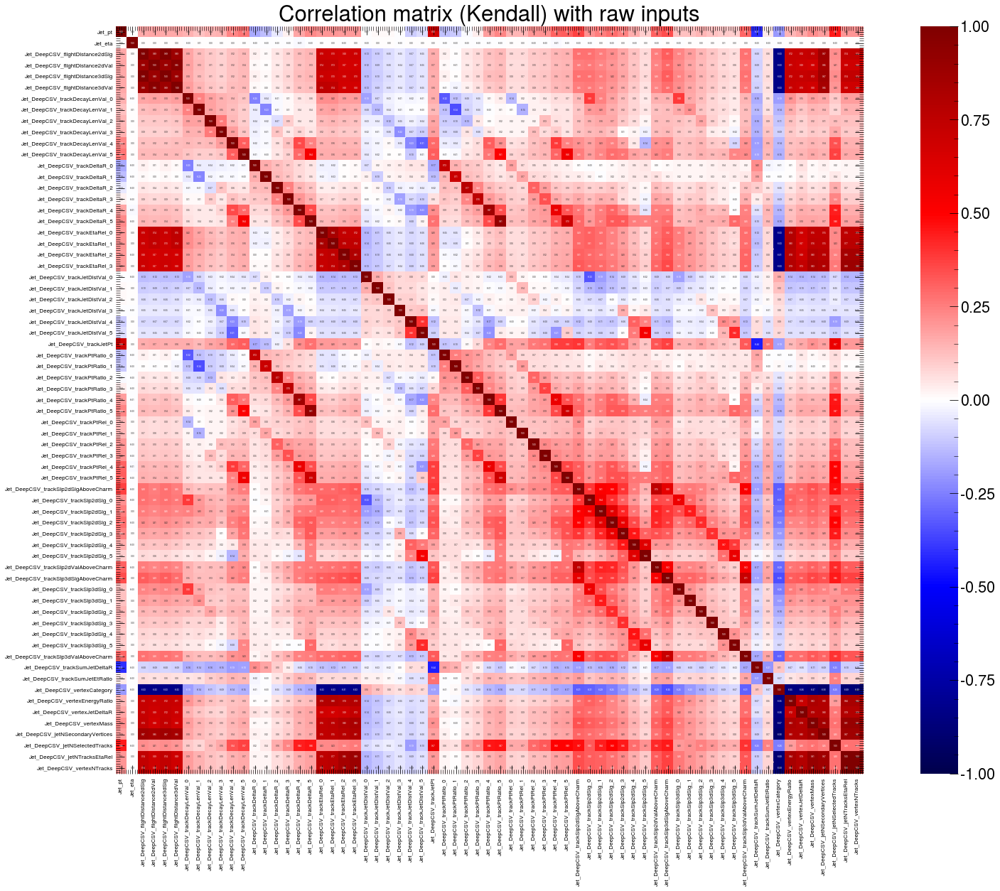

In [46]:
plot_corr(attack_mode=None, parameter=None, corr=corr_raw, arr_corr=arr_corr_raw)

findfont: Font family ['cursive'] not found. Falling back to DejaVu Sans.


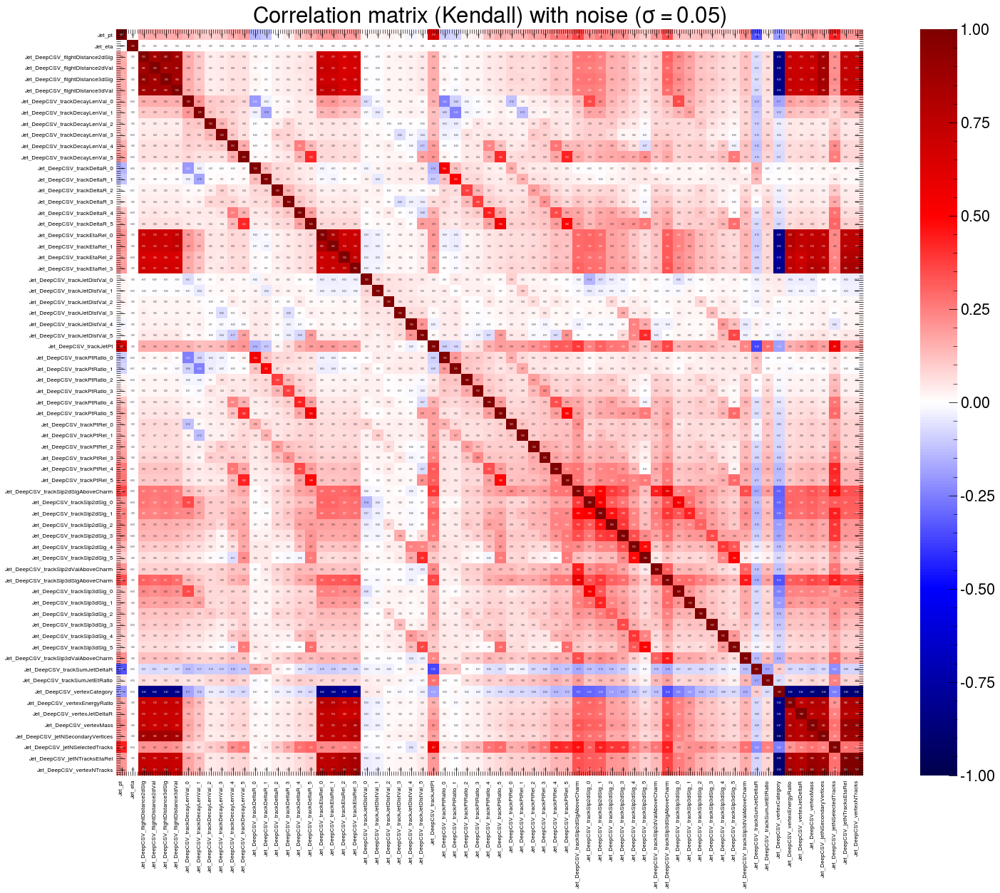

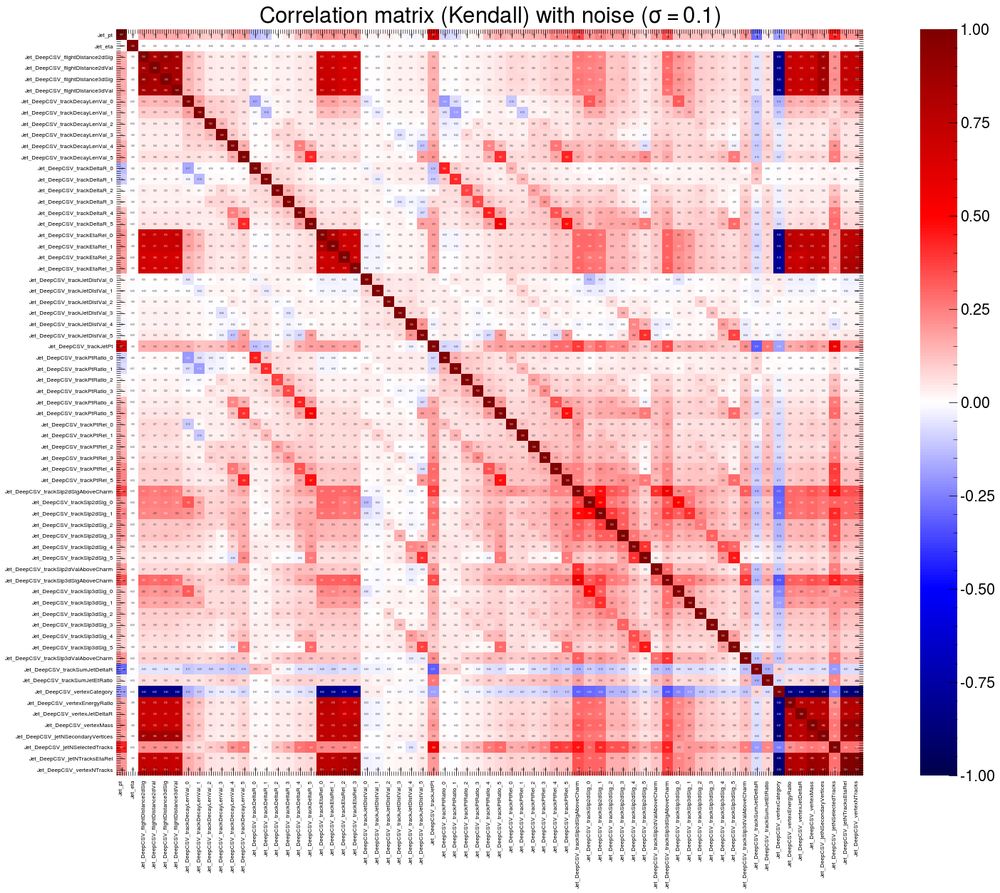

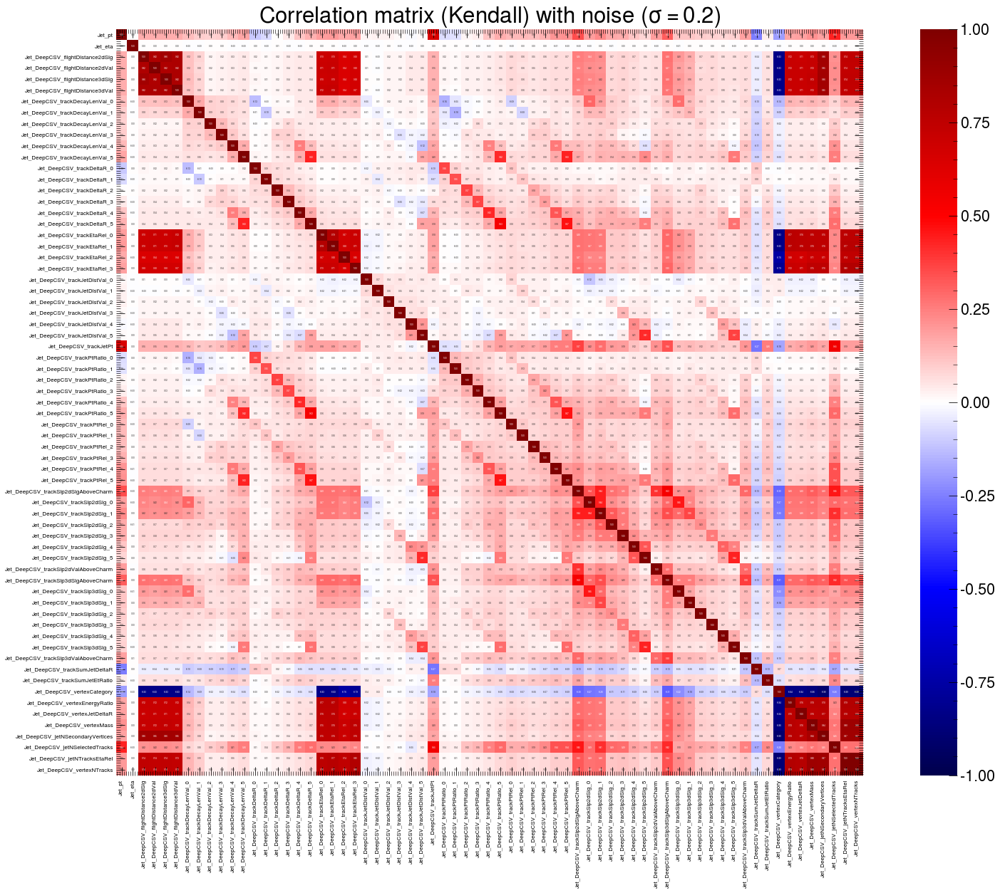

In [47]:
plot_corr(attack_mode="noise", parameter=0.05, corr=corr_xadv_noise_005, arr_corr=arr_corr_xadv_noise_005)
plot_corr(attack_mode="noise", parameter=0.1,  corr=corr_xadv_noise_01,  arr_corr=arr_corr_xadv_noise_01)
plot_corr(attack_mode="noise", parameter=0.2,  corr=corr_xadv_noise_02,  arr_corr=arr_corr_xadv_noise_02)

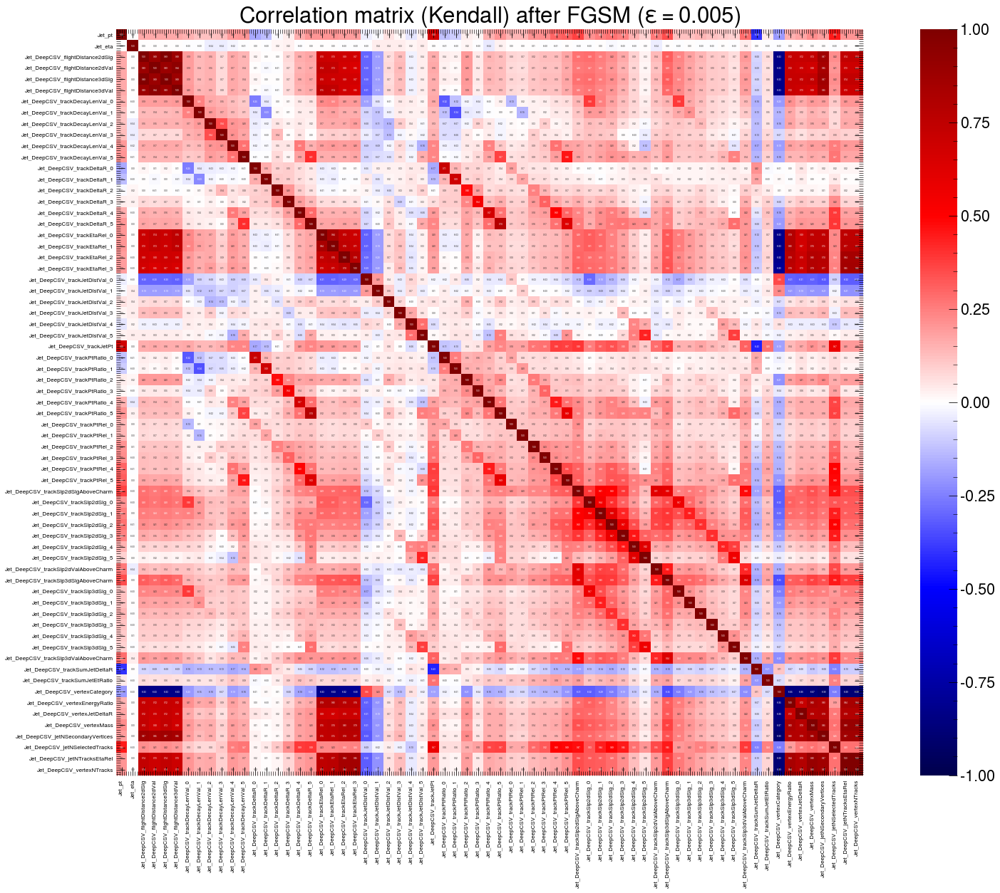

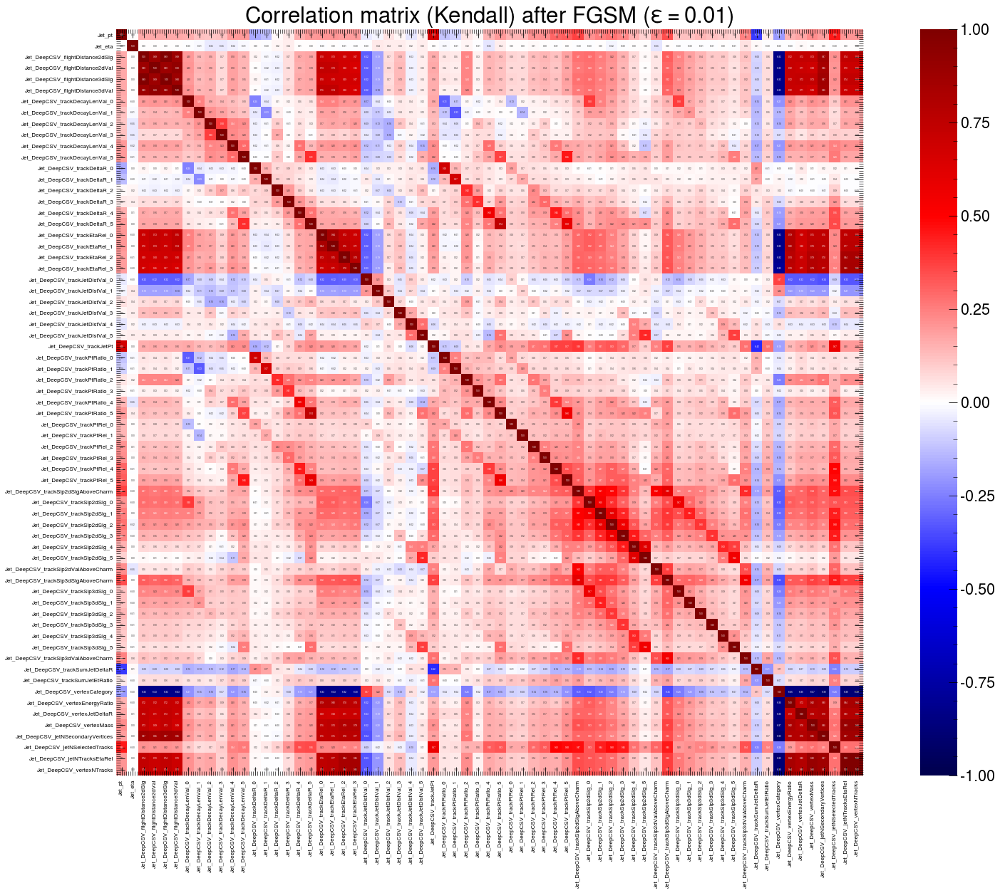

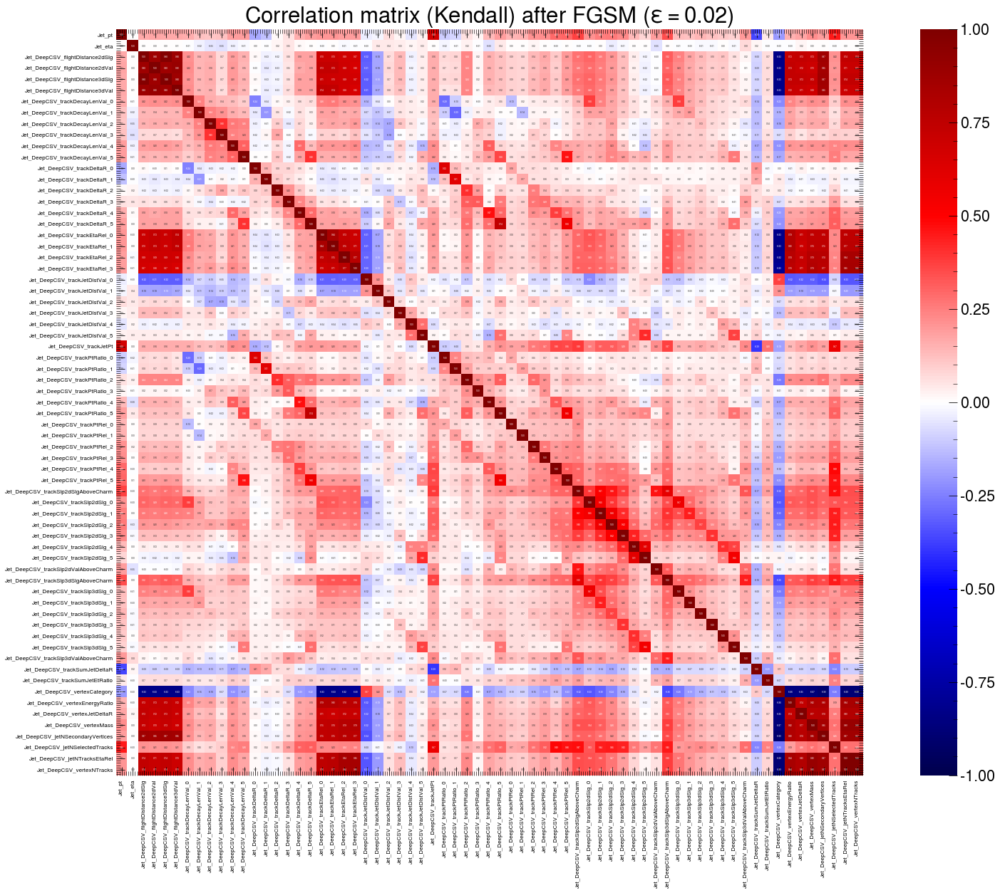

In [48]:
plot_corr(attack_mode="fgsm", parameter=0.005, corr=corr_xadv_fgsm_0005, arr_corr=arr_corr_xadv_fgsm_0005)
plot_corr(attack_mode="fgsm", parameter=0.01, corr=corr_xadv_fgsm_001, arr_corr=arr_corr_xadv_fgsm_001)
plot_corr(attack_mode="fgsm", parameter=0.02, corr=corr_xadv_fgsm_002, arr_corr=arr_corr_xadv_fgsm_002)

## Differences between correlations
### Taken as: before - after
White: no change  
Red: before the attack, the absolute correlation was higher  
Blue: after the attack, the absolute correlation is higher

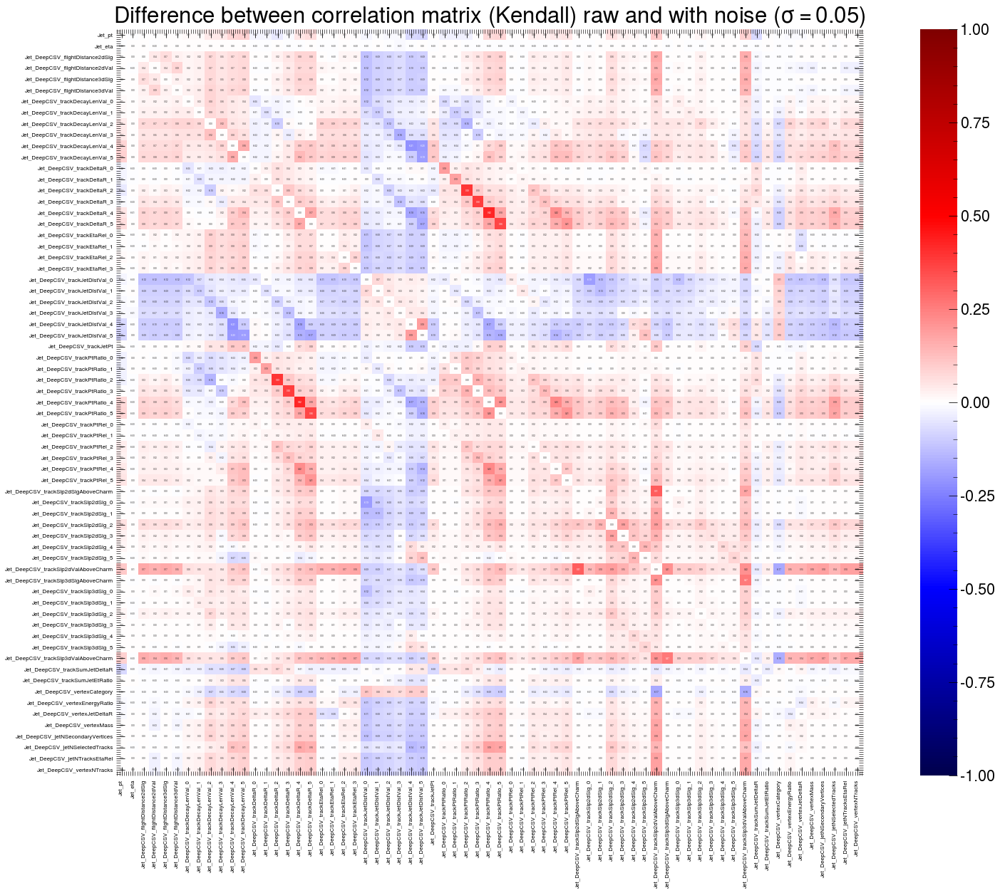

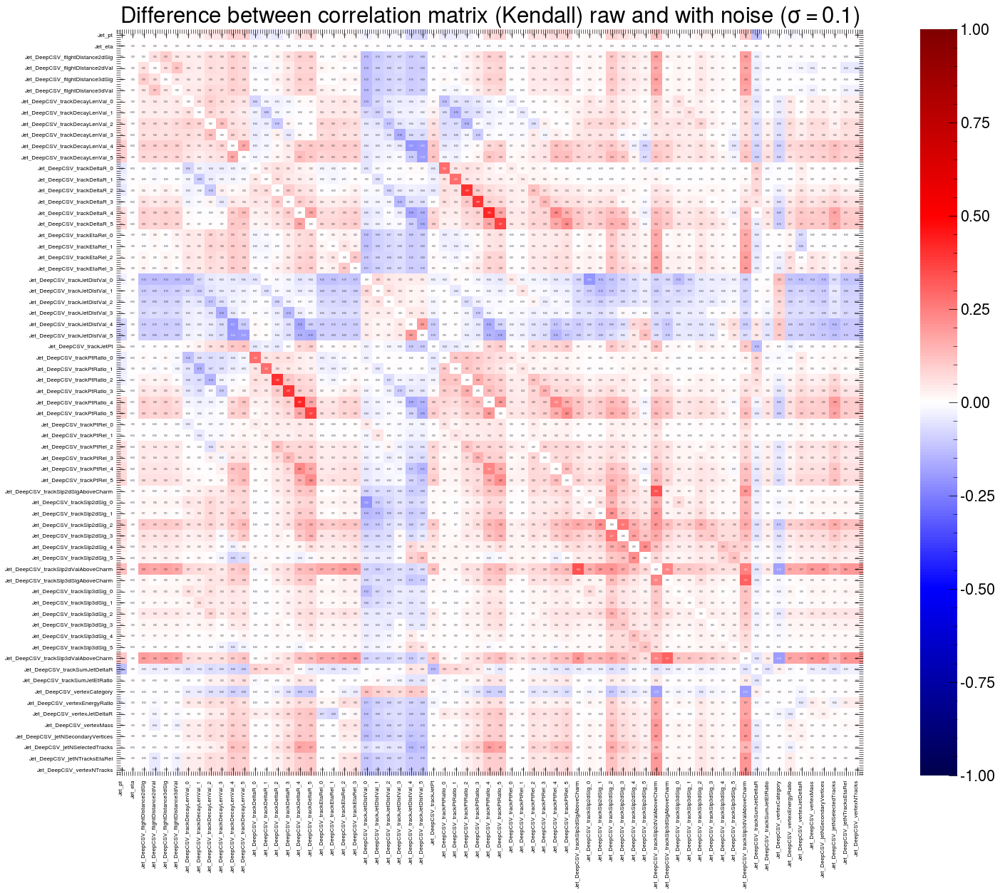

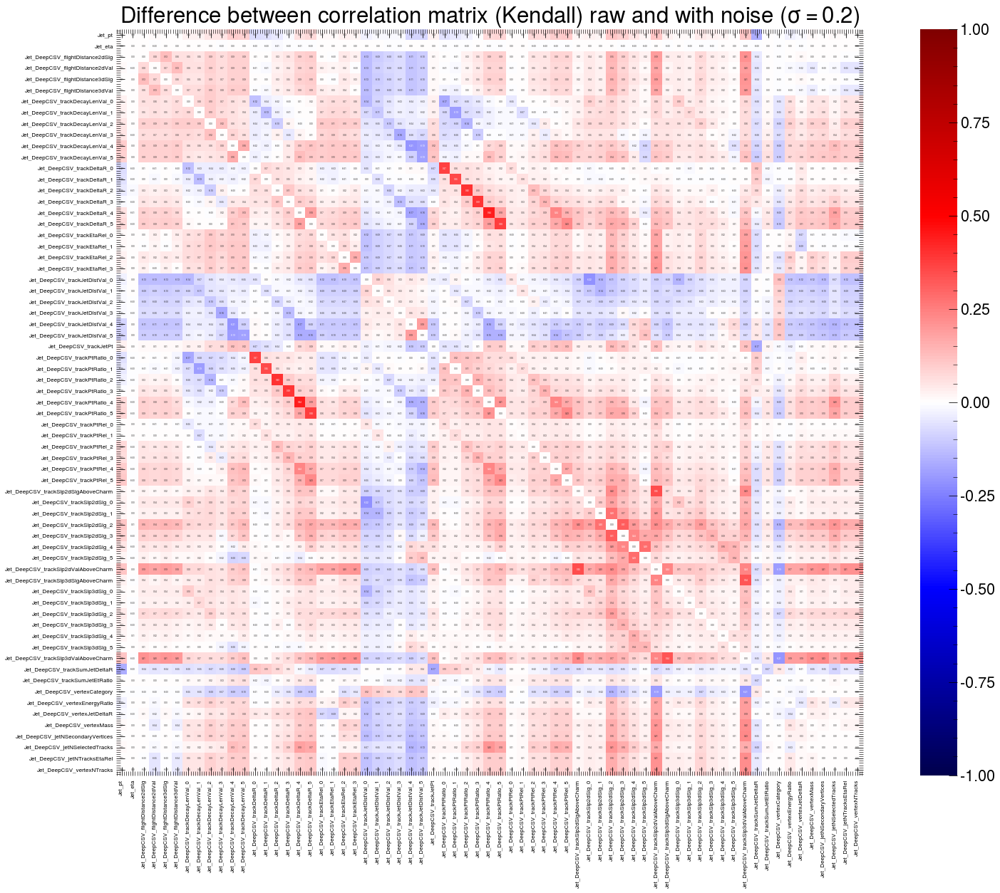

In [49]:
plot_diff_corr(attack_mode="noise", parameter=0.05, corr=corr_xadv_noise_005, arr_corr=arr_corr_xadv_noise_005)
plot_diff_corr(attack_mode="noise", parameter=0.1, corr=corr_xadv_noise_01, arr_corr=arr_corr_xadv_noise_01)
plot_diff_corr(attack_mode="noise", parameter=0.2, corr=corr_xadv_noise_02, arr_corr=arr_corr_xadv_noise_02)

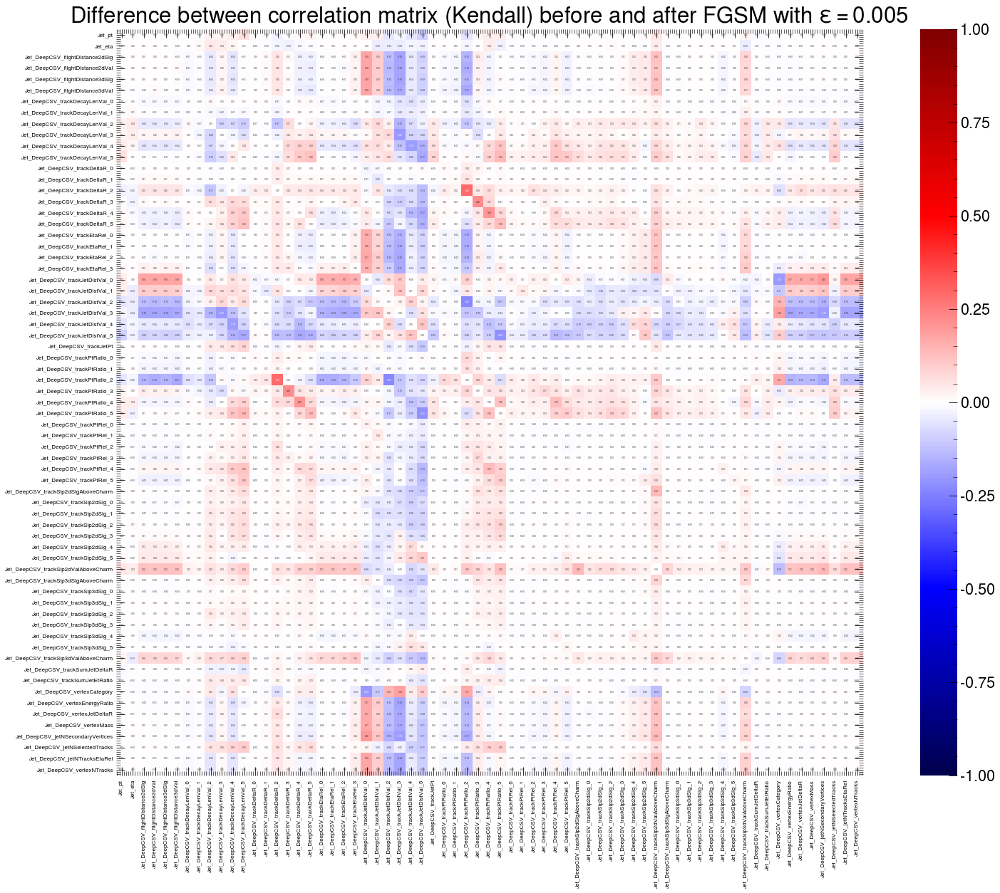

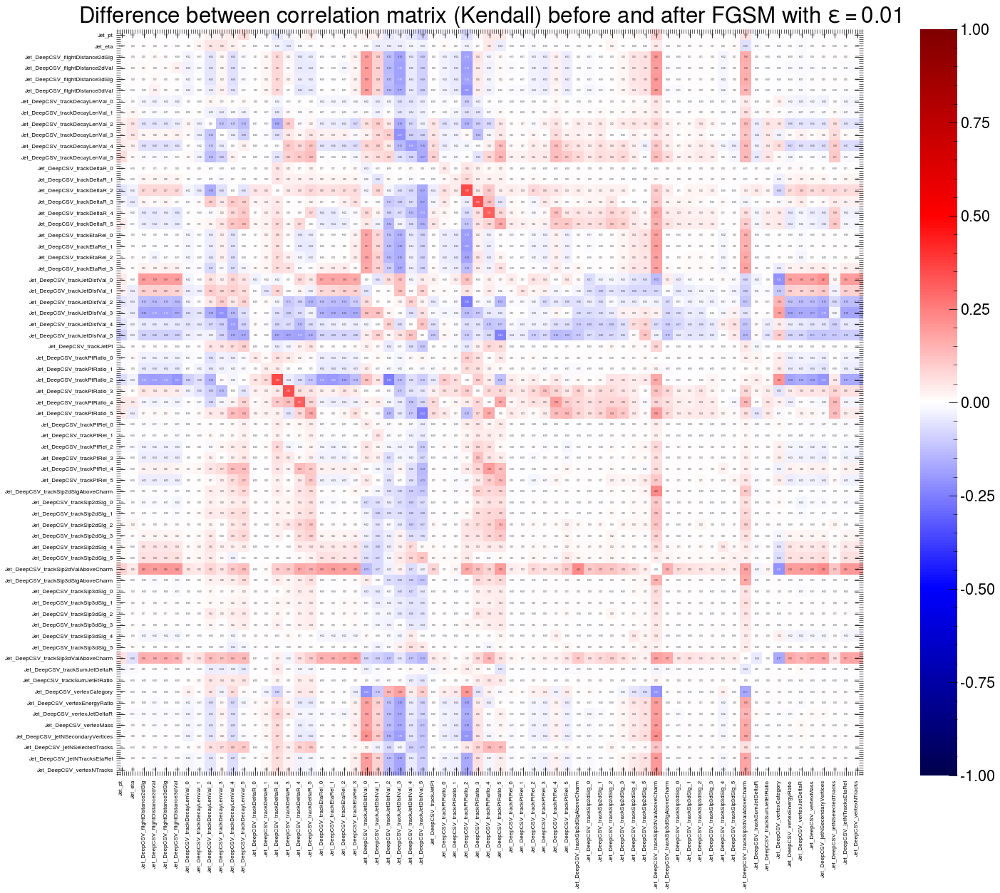

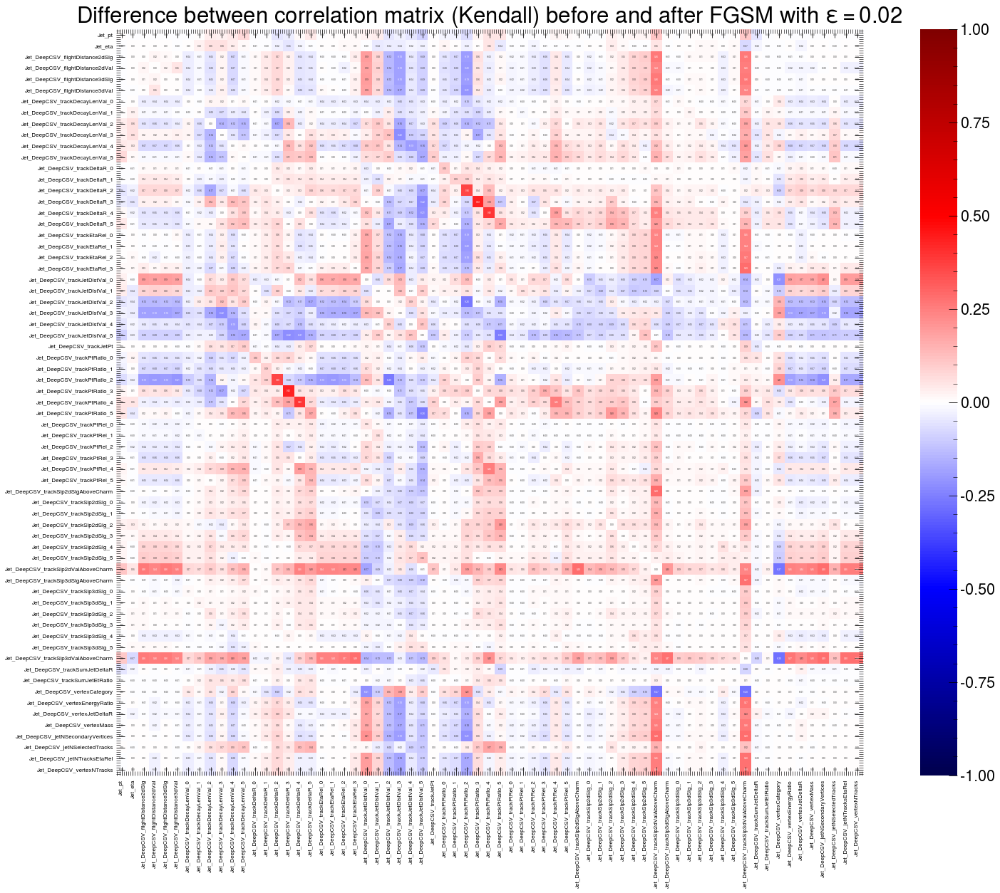

In [50]:
plot_diff_corr(attack_mode="fgsm", parameter=0.005, corr=corr_xadv_fgsm_0005, arr_corr=arr_corr_xadv_fgsm_0005)
plot_diff_corr(attack_mode="fgsm", parameter=0.01, corr=corr_xadv_fgsm_001, arr_corr=arr_corr_xadv_fgsm_001)
plot_diff_corr(attack_mode="fgsm", parameter=0.02, corr=corr_xadv_fgsm_002, arr_corr=arr_corr_xadv_fgsm_002)

## Relative differences between correlations
### Taken as: (before - after) / before
White: no change  
Red: before the attack, the absolute correlation was higher  
Blue: after the attack, the absolute correlation is higher

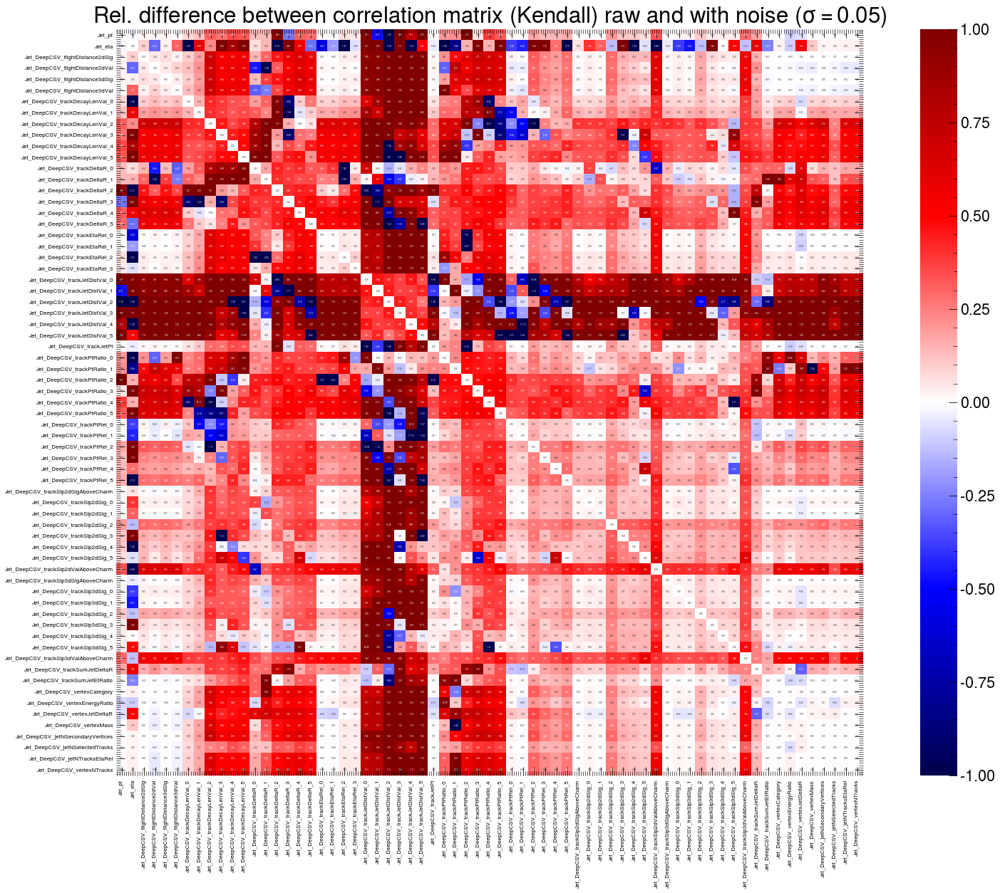

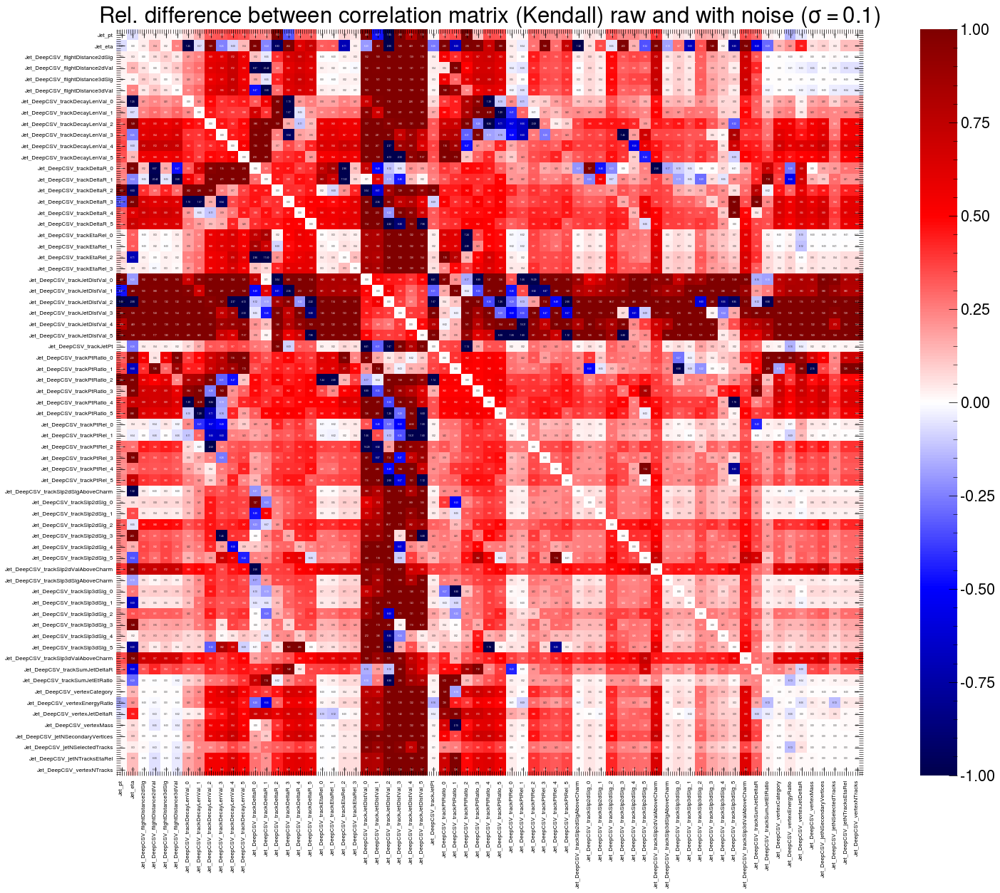

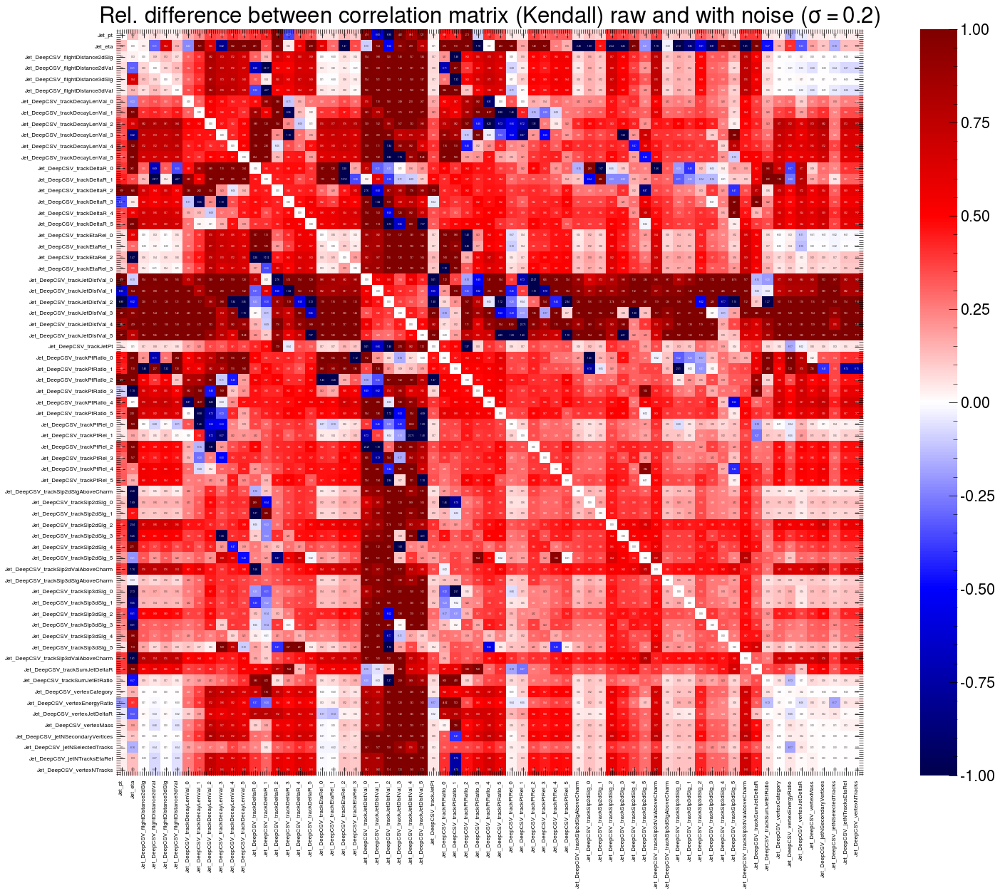

In [51]:
plot_rel_diff_corr(attack_mode="noise", parameter=0.05, corr=corr_xadv_noise_005, arr_corr=arr_corr_xadv_noise_005)
plot_rel_diff_corr(attack_mode="noise", parameter=0.1, corr=corr_xadv_noise_01, arr_corr=arr_corr_xadv_noise_01)
plot_rel_diff_corr(attack_mode="noise", parameter=0.2, corr=corr_xadv_noise_02, arr_corr=arr_corr_xadv_noise_02)

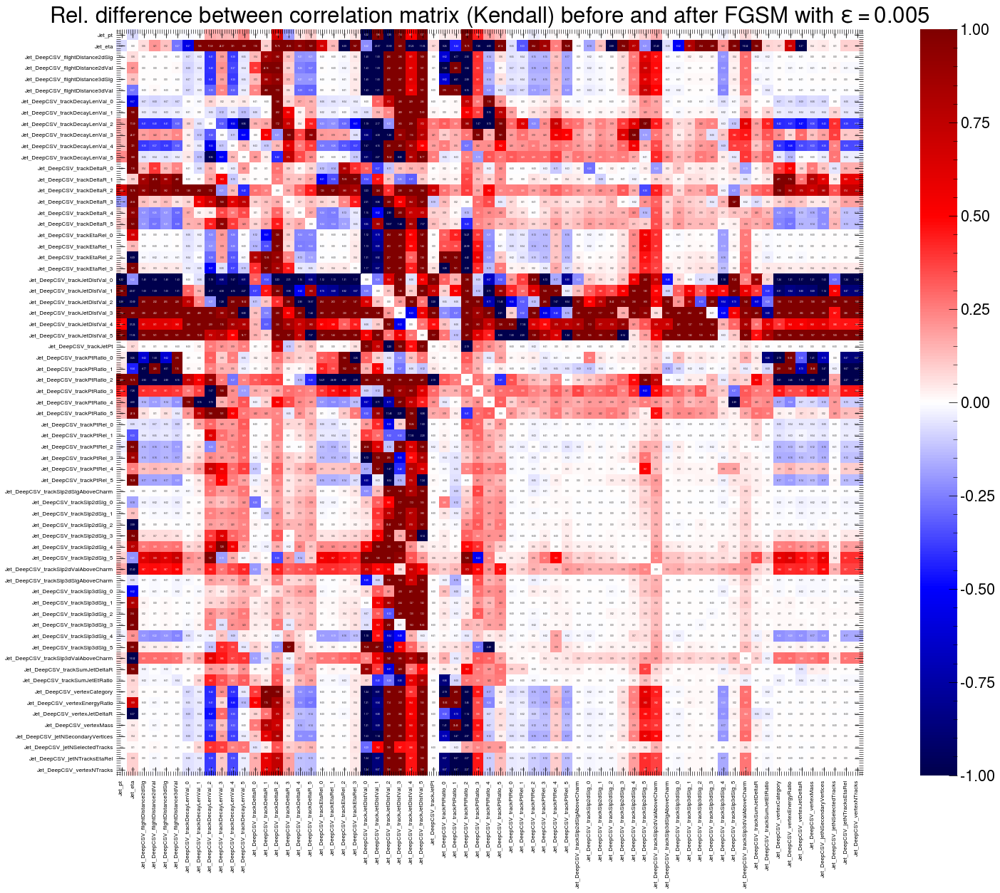

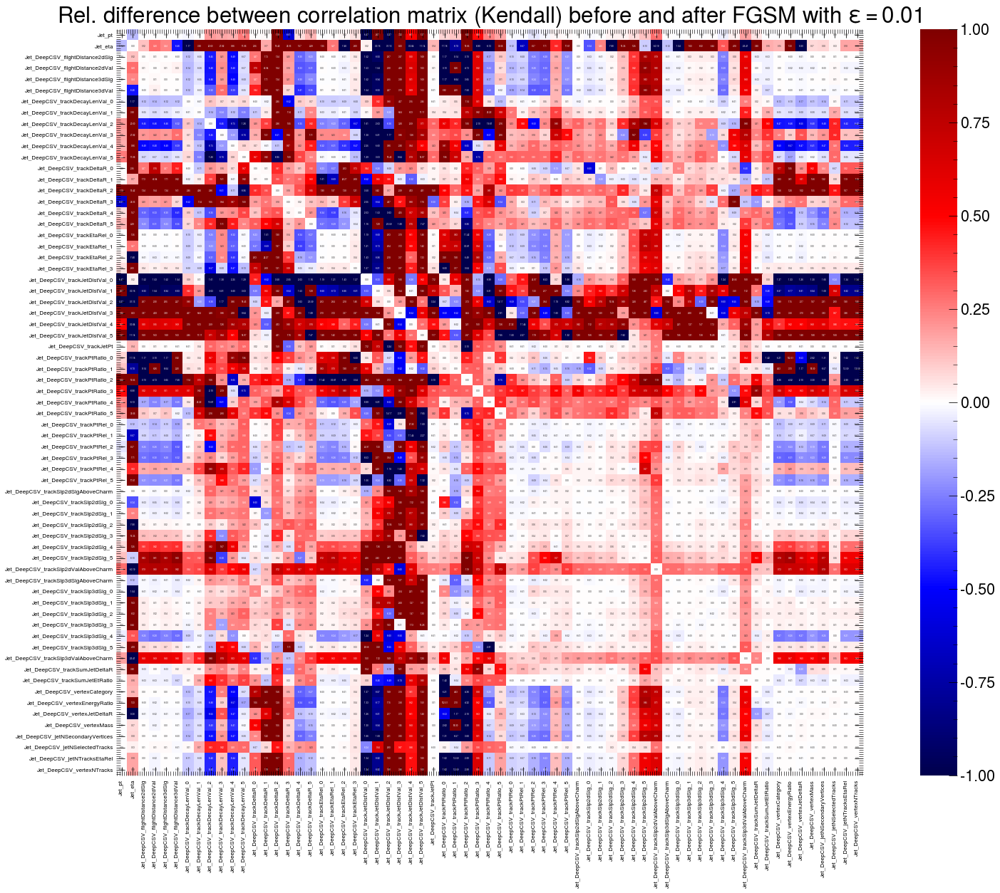

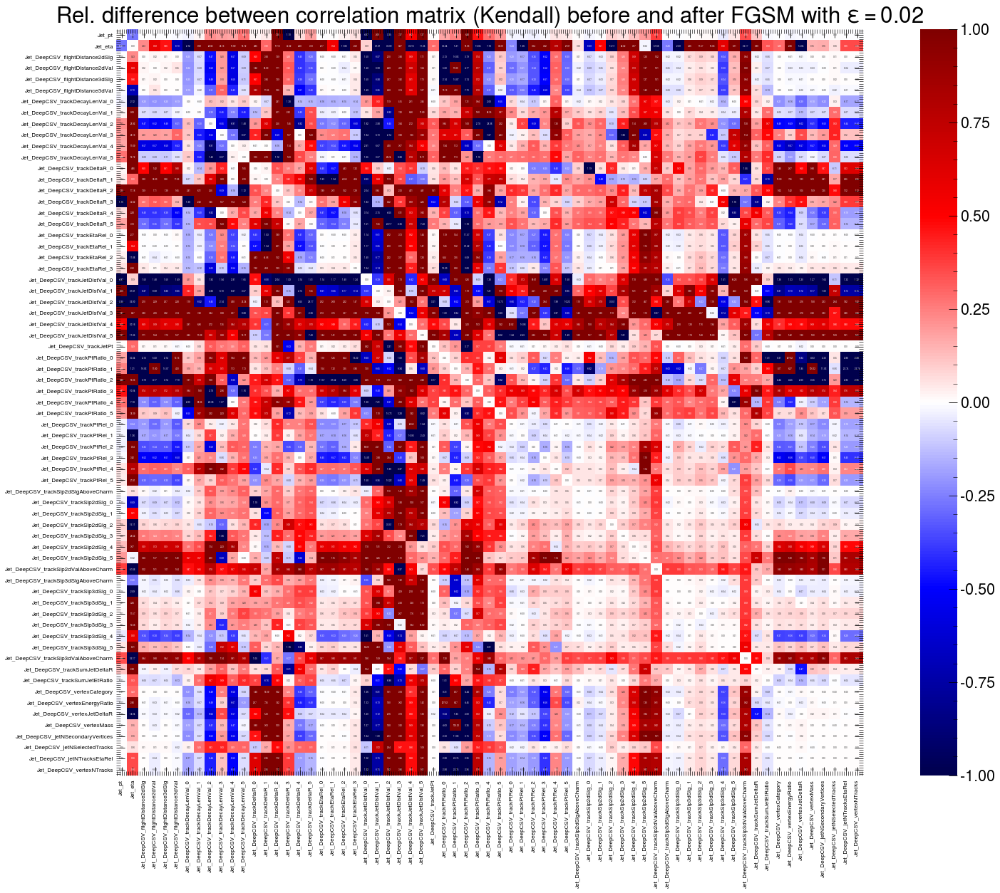

In [52]:
plot_rel_diff_corr(attack_mode="fgsm", parameter=0.005, corr=corr_xadv_fgsm_0005, arr_corr=arr_corr_xadv_fgsm_0005)
plot_rel_diff_corr(attack_mode="fgsm", parameter=0.01, corr=corr_xadv_fgsm_001, arr_corr=arr_corr_xadv_fgsm_001)
plot_rel_diff_corr(attack_mode="fgsm", parameter=0.02, corr=corr_xadv_fgsm_002, arr_corr=arr_corr_xadv_fgsm_002)

## Absolute correlations
Red: high absolute correlation (can be either positive or negative)  
White: uncorrelated

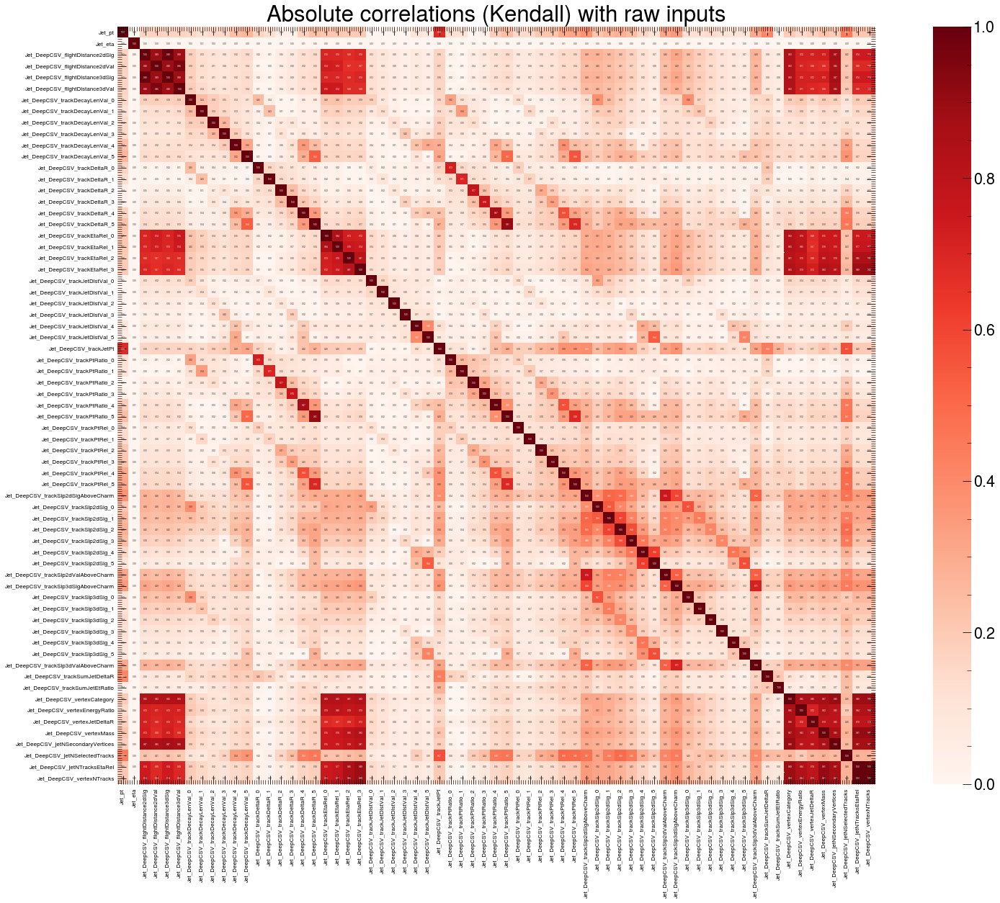

In [57]:
plot_abs_corr(attack_mode=None, parameter=None, corr=corr_raw, arr_corr=arr_corr_raw)

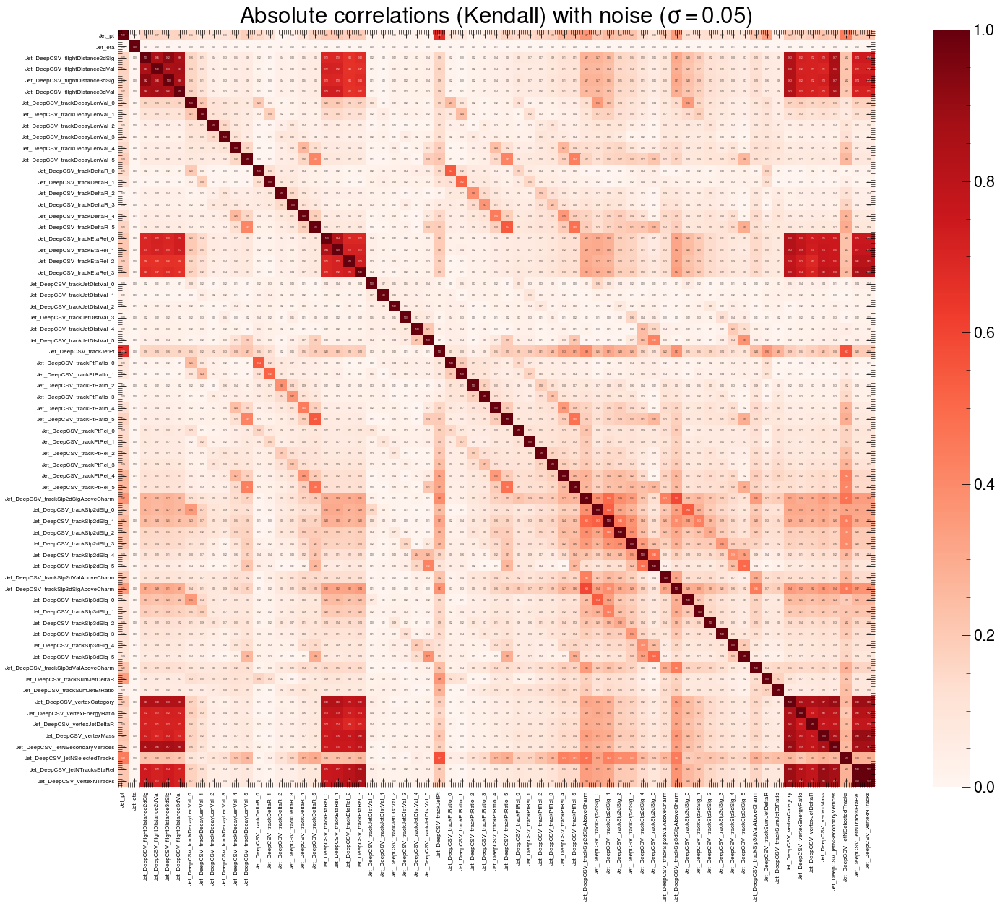

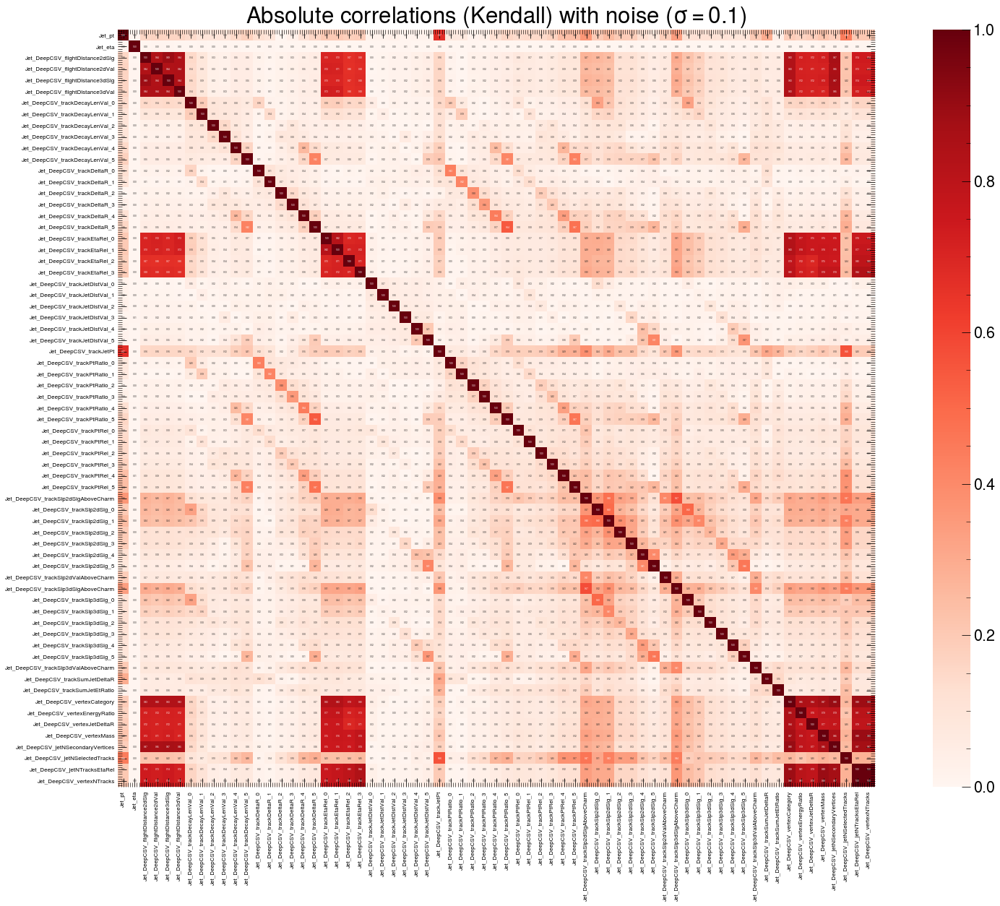

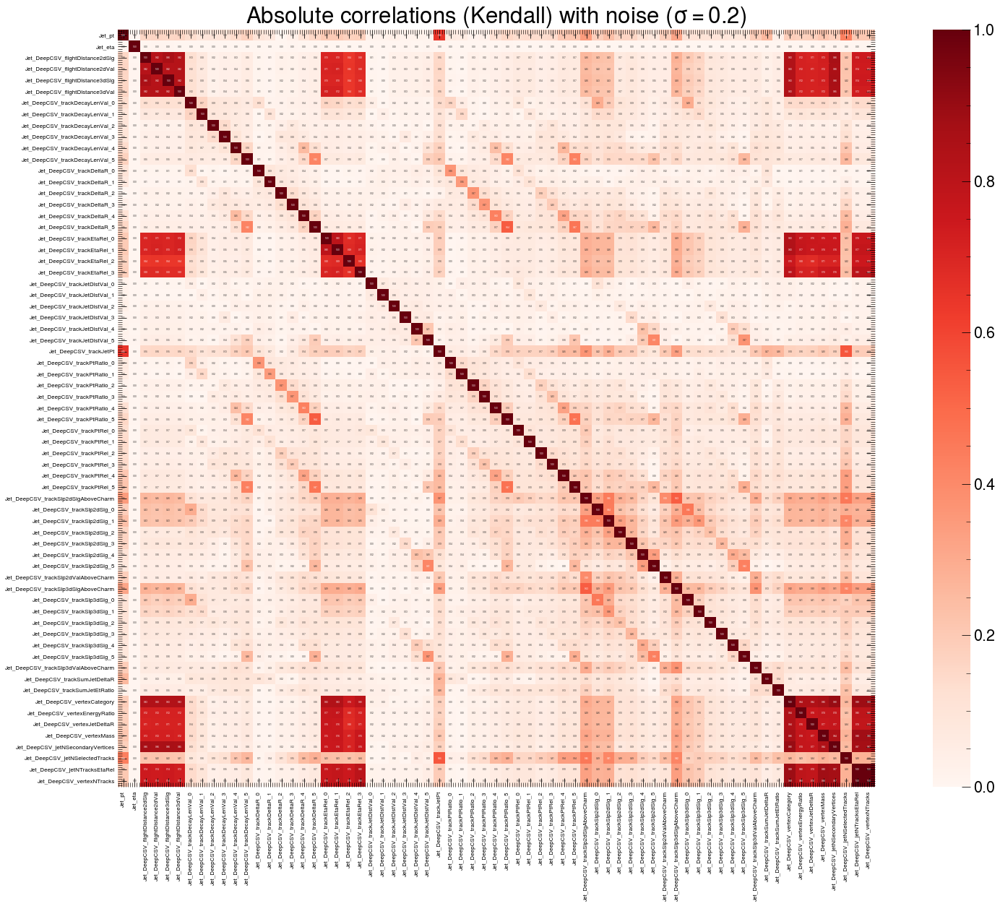

In [58]:
plot_abs_corr(attack_mode="noise", parameter=0.05, corr=corr_xadv_noise_005, arr_corr=arr_corr_xadv_noise_005)
plot_abs_corr(attack_mode="noise", parameter=0.1,  corr=corr_xadv_noise_01,  arr_corr=arr_corr_xadv_noise_01)
plot_abs_corr(attack_mode="noise", parameter=0.2,  corr=corr_xadv_noise_02,  arr_corr=arr_corr_xadv_noise_02)

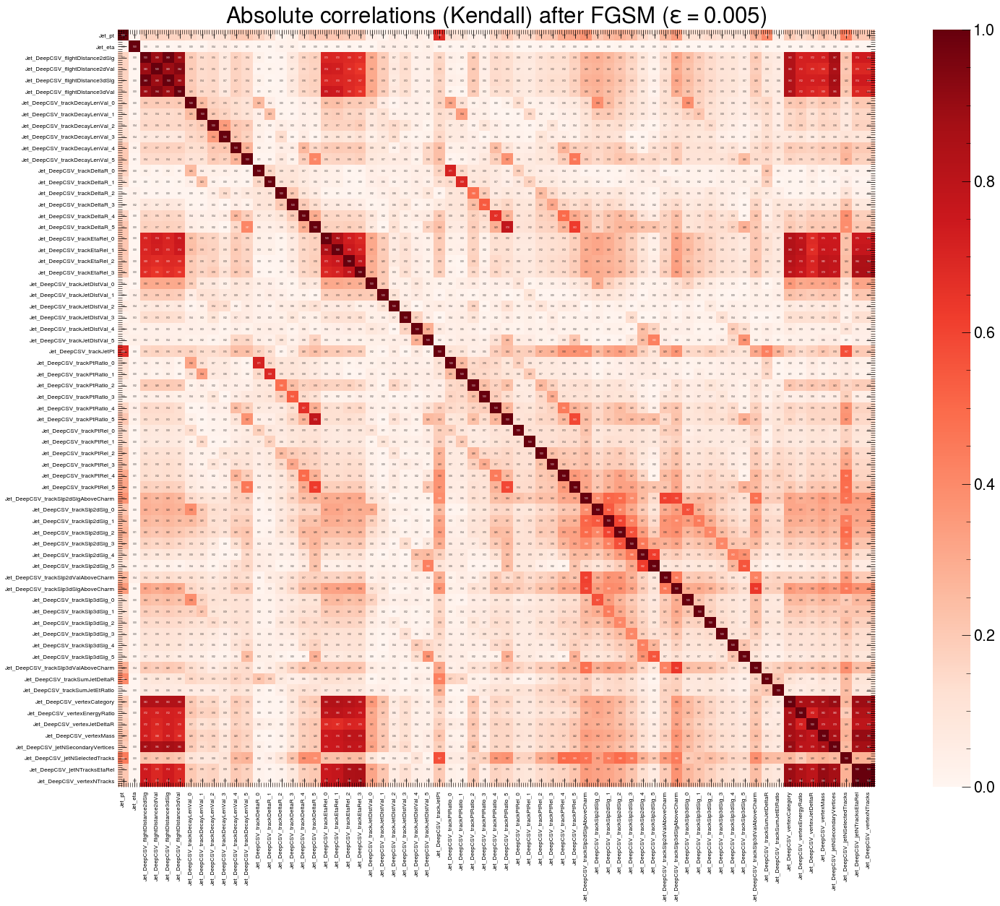

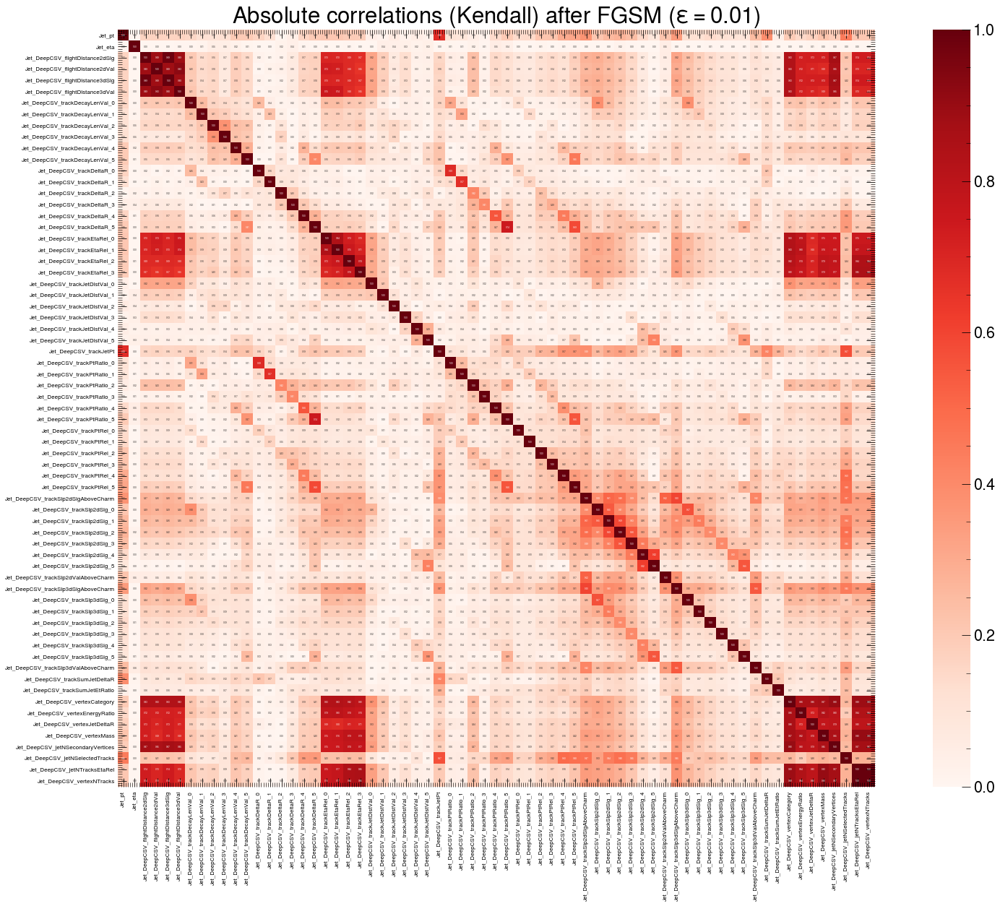

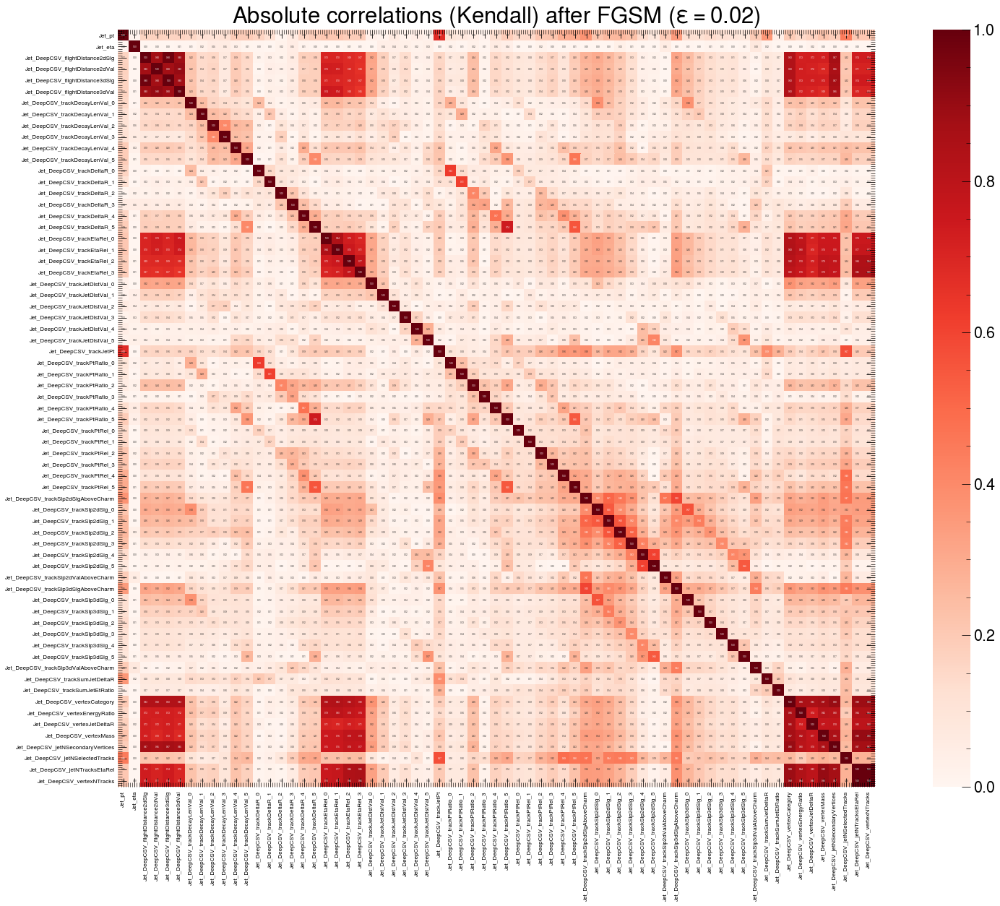

In [59]:
plot_abs_corr(attack_mode="fgsm", parameter=0.005, corr=corr_xadv_fgsm_0005, arr_corr=arr_corr_xadv_fgsm_0005)
plot_abs_corr(attack_mode="fgsm", parameter=0.01,  corr=corr_xadv_fgsm_001,  arr_corr=arr_corr_xadv_fgsm_001)
plot_abs_corr(attack_mode="fgsm", parameter=0.02,  corr=corr_xadv_fgsm_002,  arr_corr=arr_corr_xadv_fgsm_002)

## Differences between absolute correlations
### Taken as: abs(before) - abs(after)
White: no change  
Red: before the attack, the absolute correlation was higher  
Blue: after the attack, the absolute correlation is higher

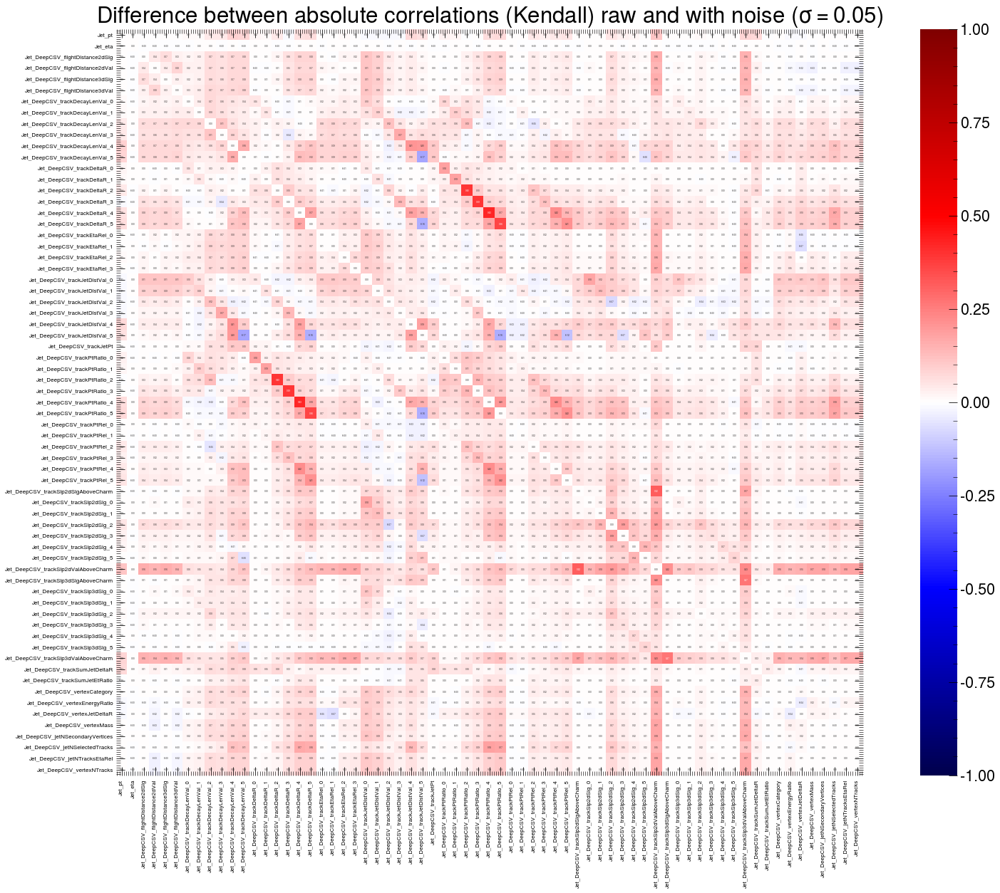

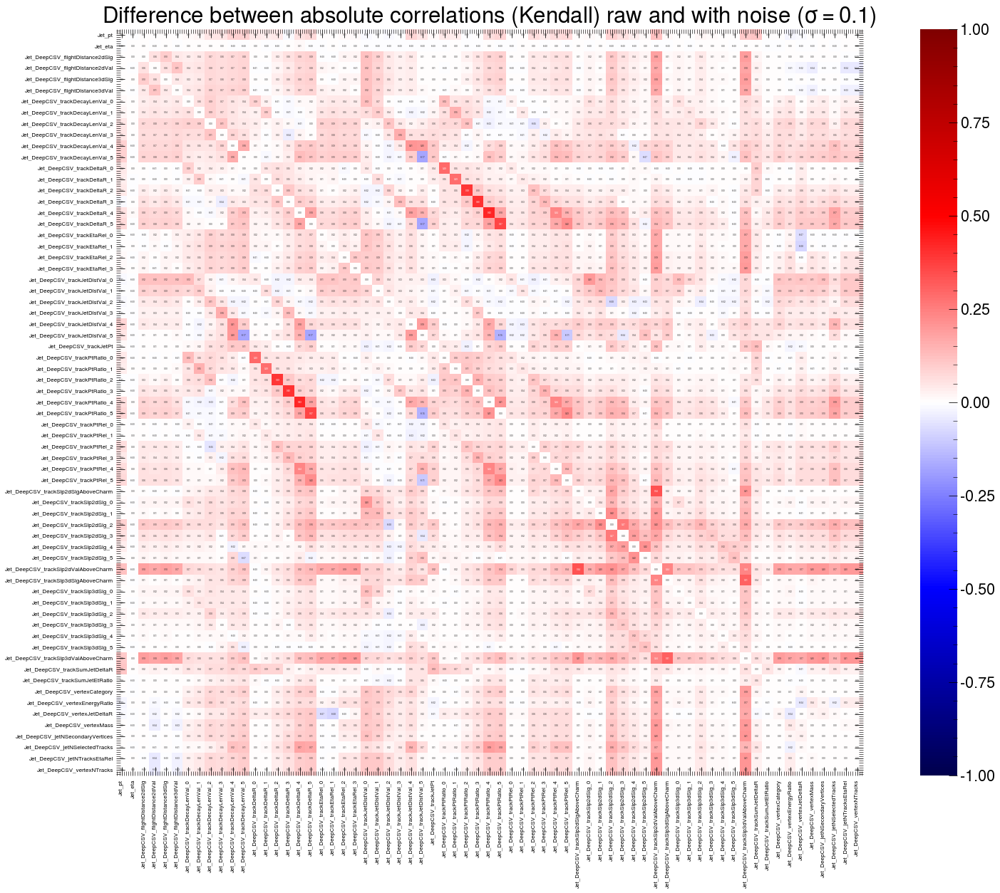

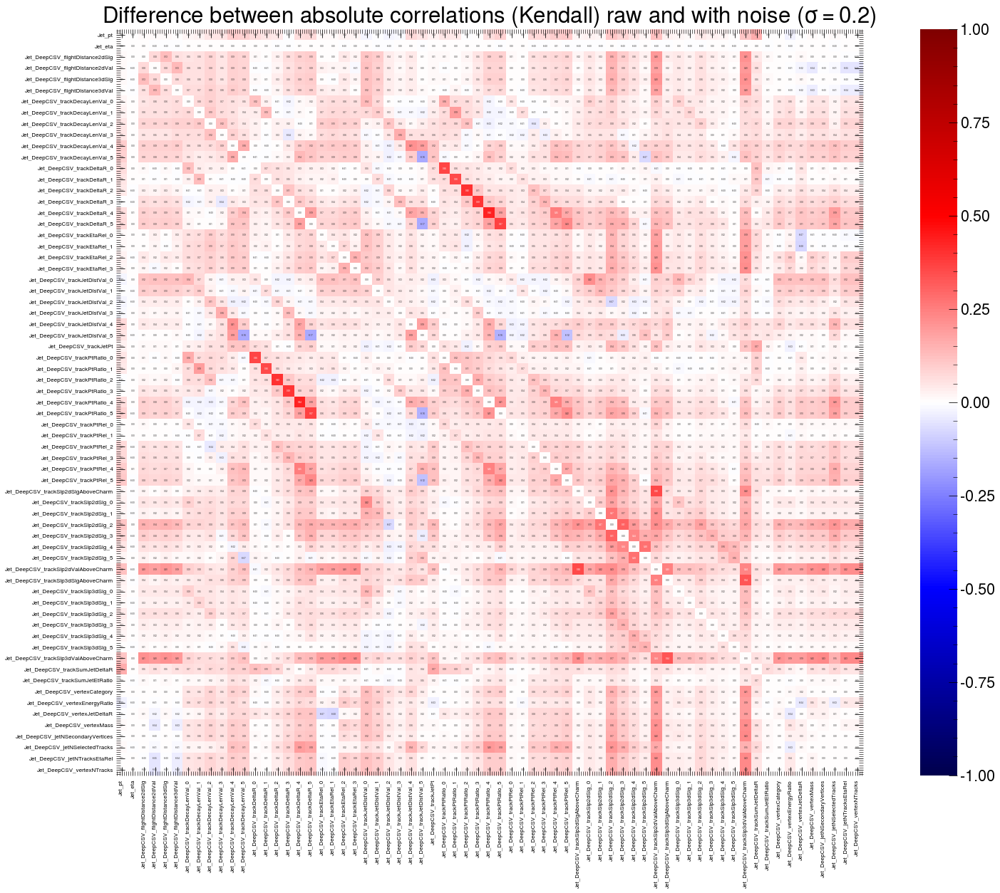

In [61]:
plot_abs_diff_corr(attack_mode="noise", parameter=0.05, corr=corr_xadv_noise_005, arr_corr=arr_corr_xadv_noise_005)
plot_abs_diff_corr(attack_mode="noise", parameter=0.1, corr=corr_xadv_noise_01, arr_corr=arr_corr_xadv_noise_01)
plot_abs_diff_corr(attack_mode="noise", parameter=0.2, corr=corr_xadv_noise_02, arr_corr=arr_corr_xadv_noise_02)

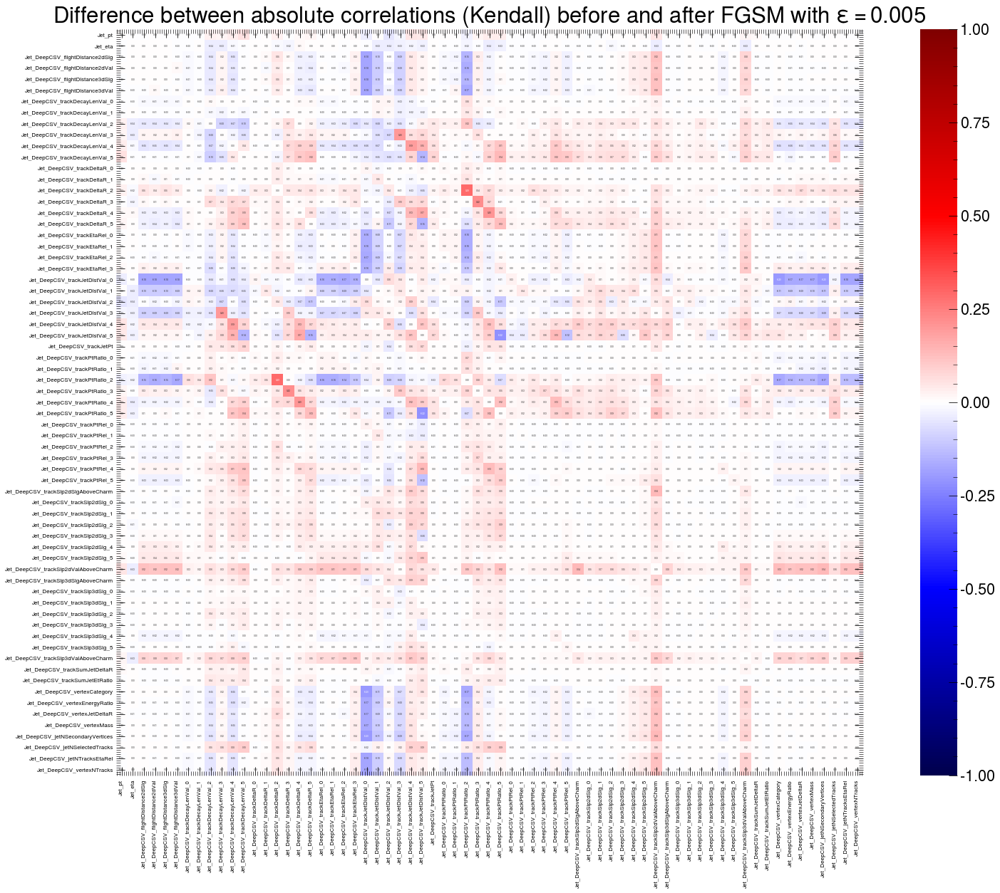

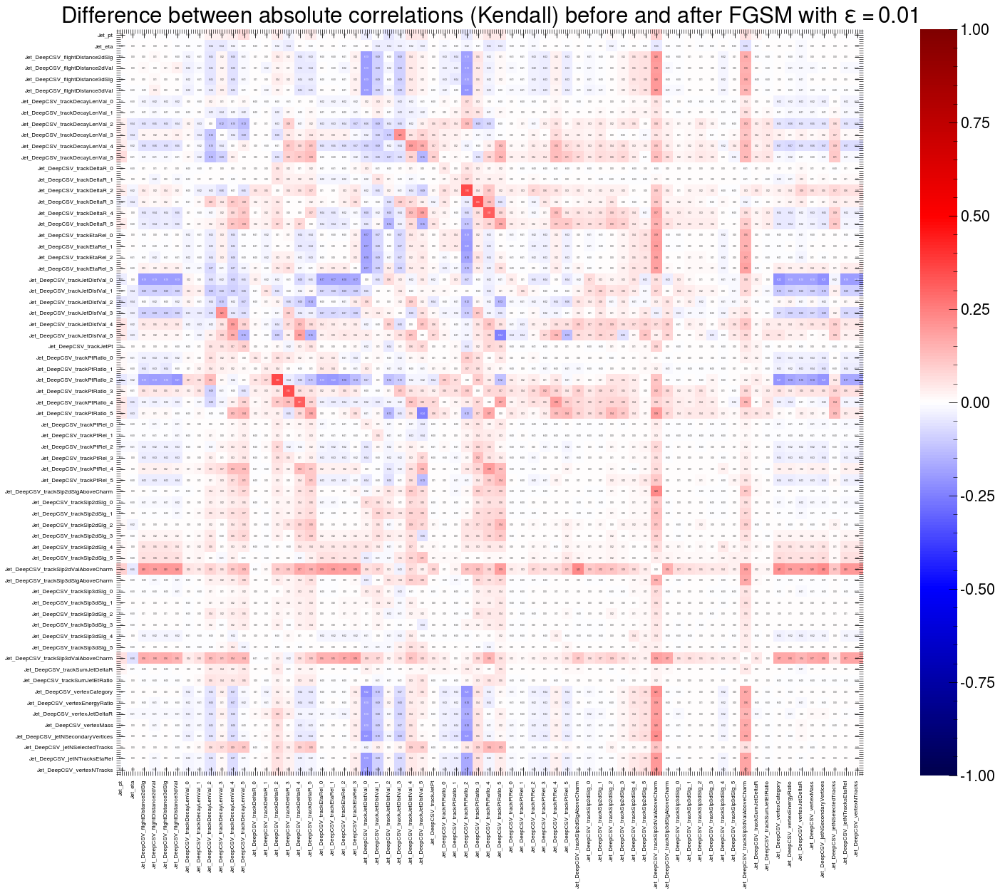

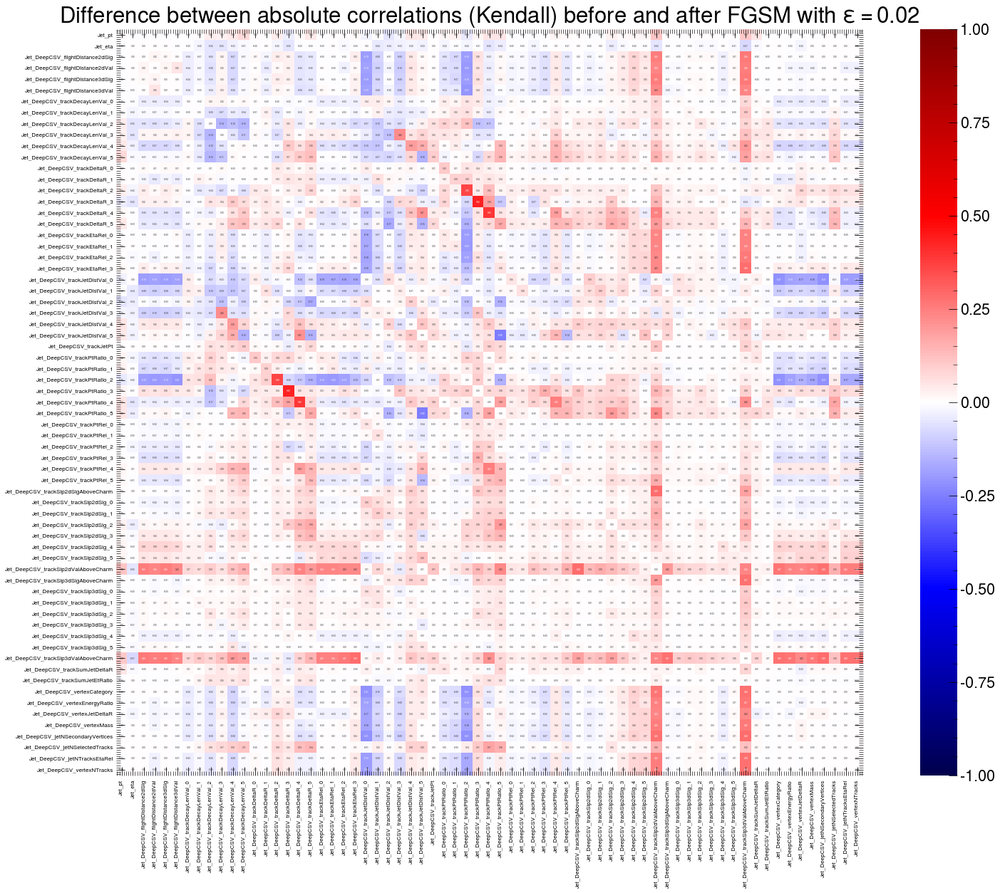

In [62]:
plot_abs_diff_corr(attack_mode="fgsm", parameter=0.005, corr=corr_xadv_fgsm_0005, arr_corr=arr_corr_xadv_fgsm_0005)
plot_abs_diff_corr(attack_mode="fgsm", parameter=0.01, corr=corr_xadv_fgsm_001, arr_corr=arr_corr_xadv_fgsm_001)
plot_abs_diff_corr(attack_mode="fgsm", parameter=0.02, corr=corr_xadv_fgsm_002, arr_corr=arr_corr_xadv_fgsm_002)

## Absolute differences between correlations
### Taken as: abs(before - after)
White: no change  
Red: large impact of attack on correlations

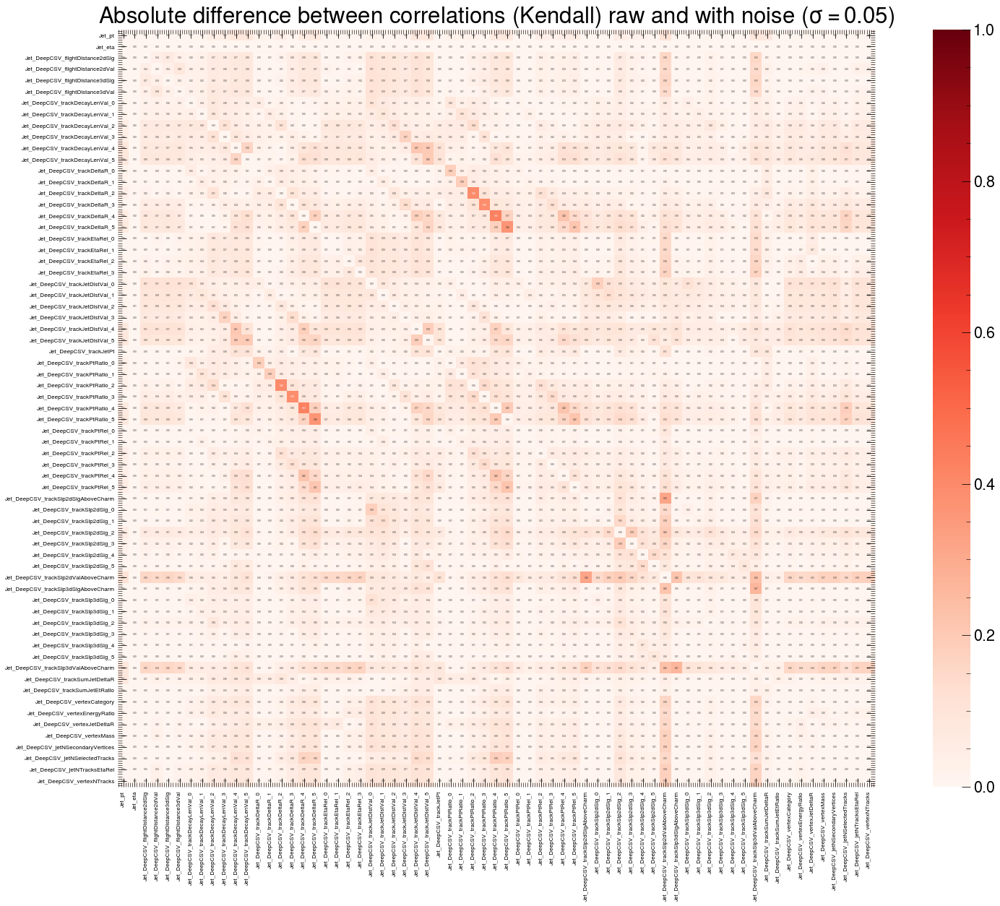

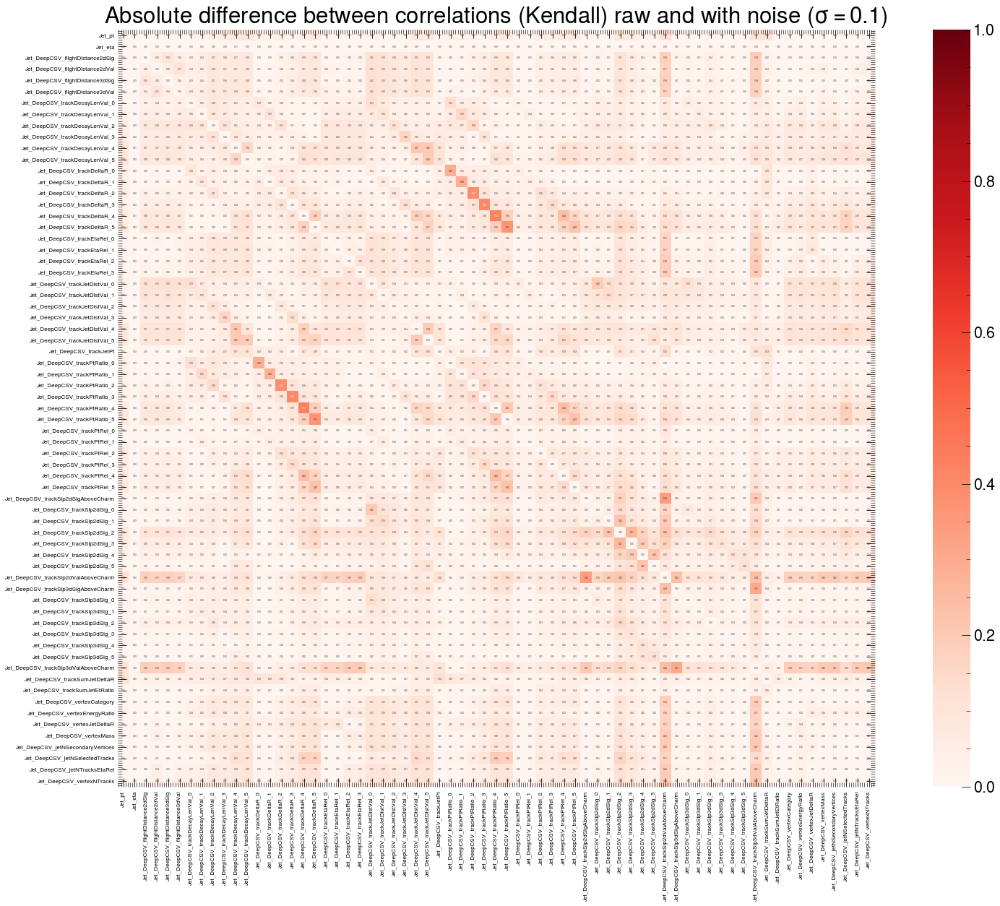

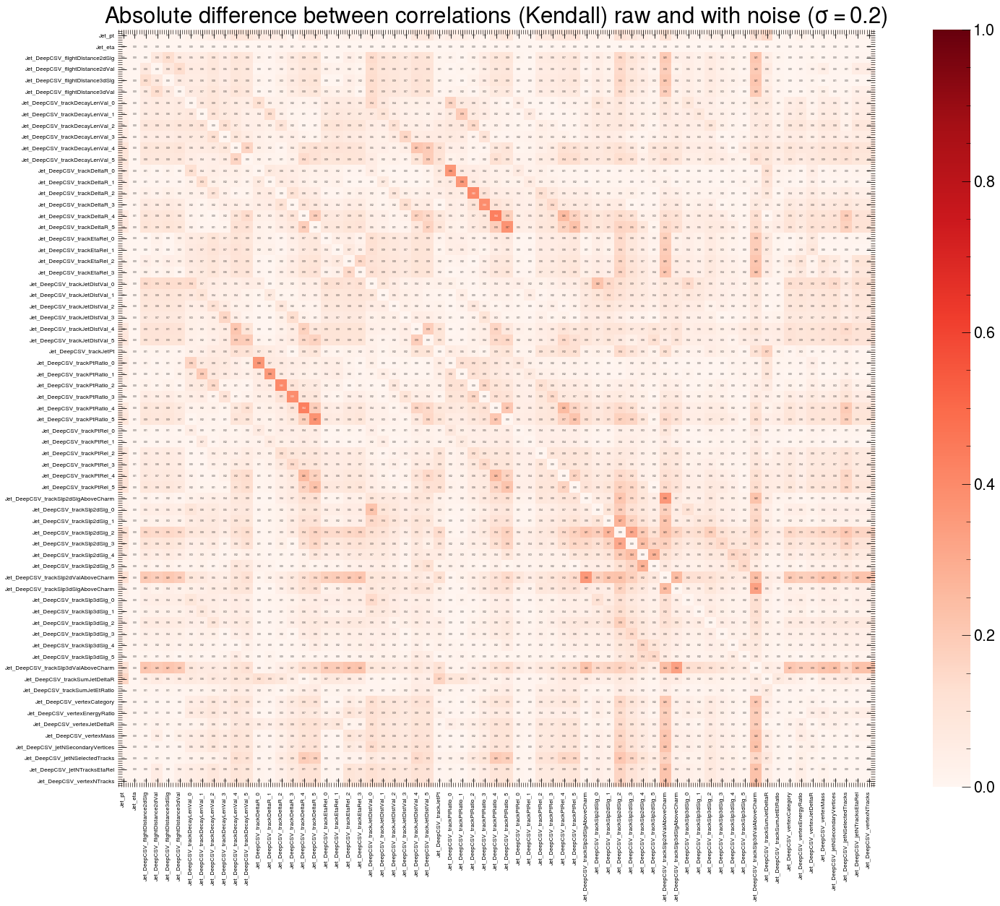

In [65]:
plot_diff_abs_corr(attack_mode="noise", parameter=0.05, corr=corr_xadv_noise_005, arr_corr=arr_corr_xadv_noise_005)
plot_diff_abs_corr(attack_mode="noise", parameter=0.1, corr=corr_xadv_noise_01, arr_corr=arr_corr_xadv_noise_01)
plot_diff_abs_corr(attack_mode="noise", parameter=0.2, corr=corr_xadv_noise_02, arr_corr=arr_corr_xadv_noise_02)

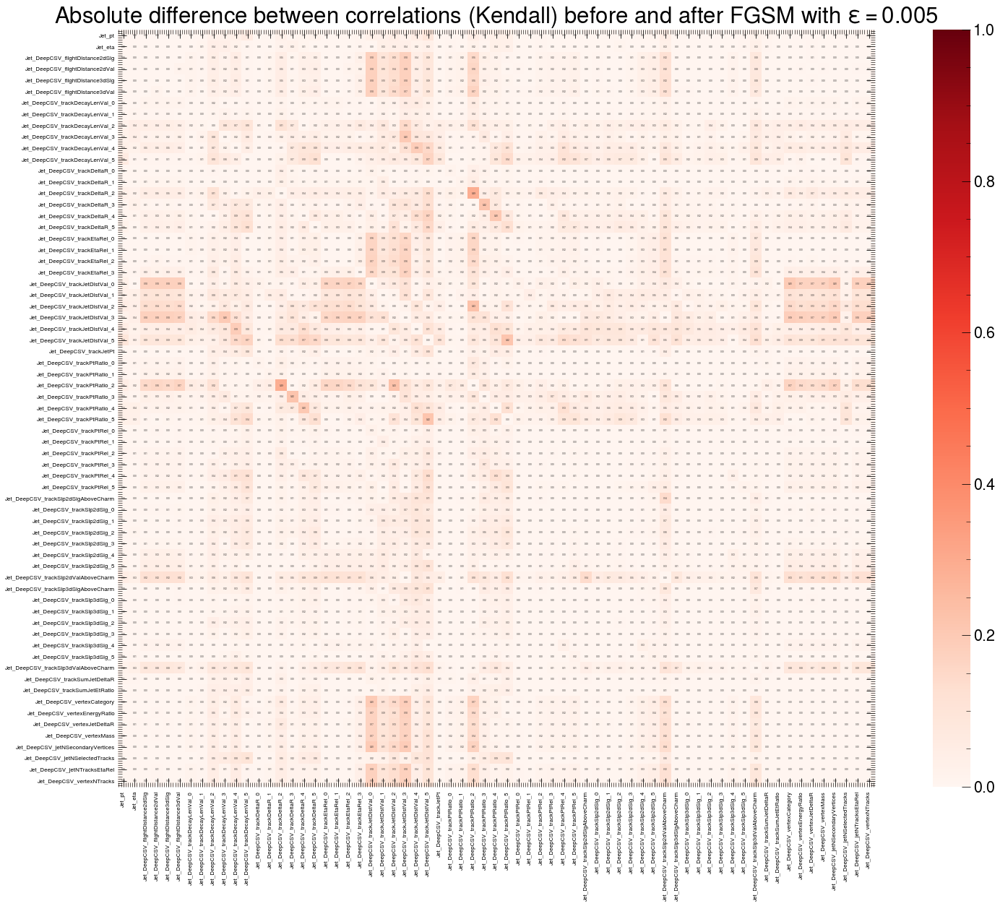

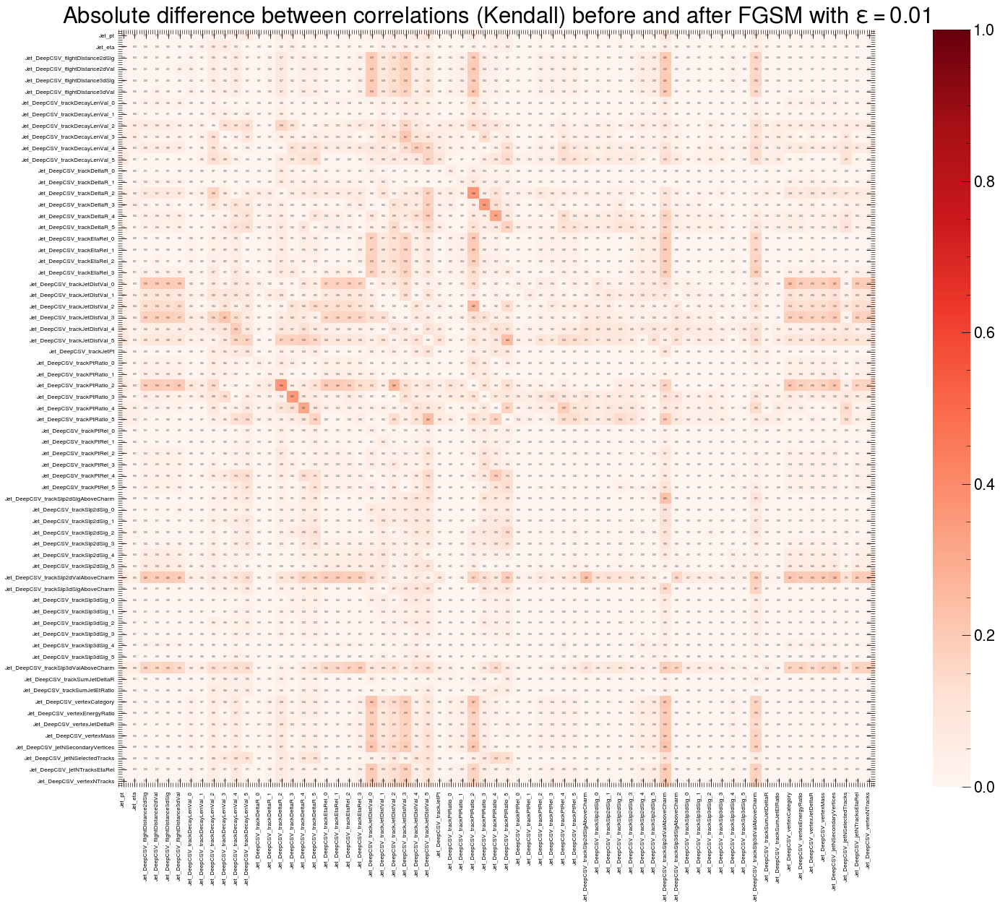

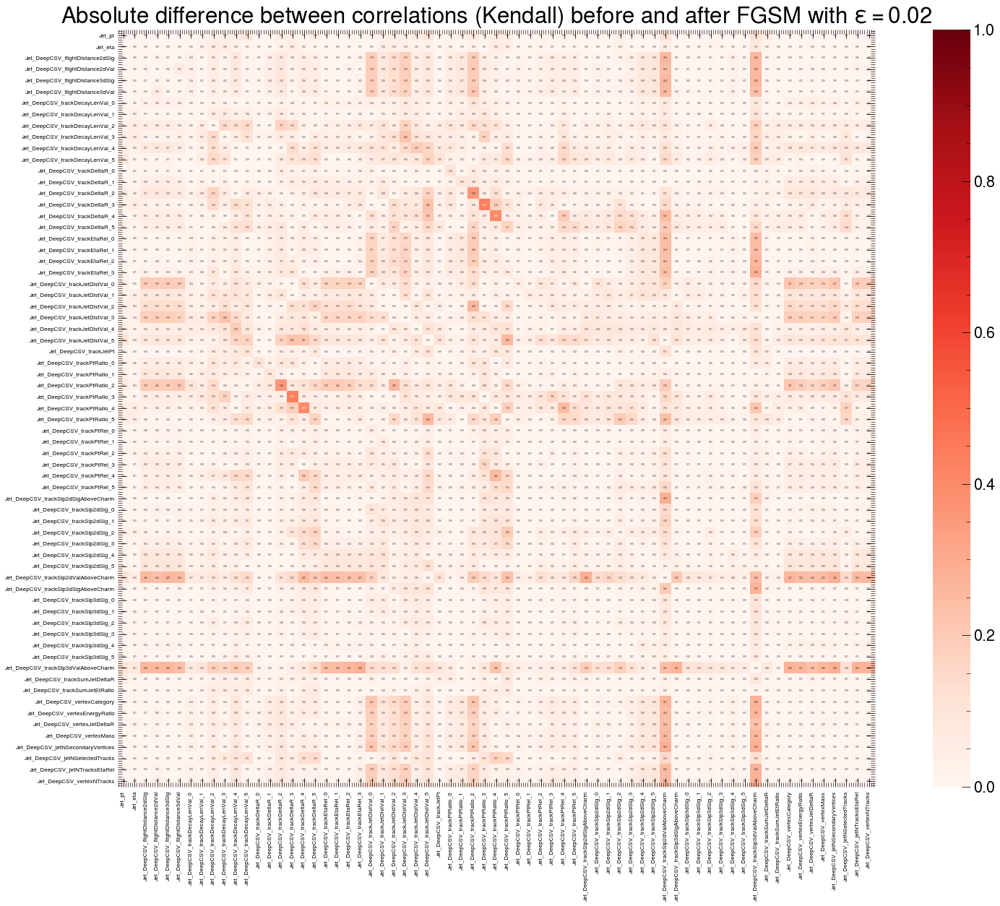

In [66]:
plot_diff_abs_corr(attack_mode="fgsm", parameter=0.005, corr=corr_xadv_fgsm_0005, arr_corr=arr_corr_xadv_fgsm_0005)
plot_diff_abs_corr(attack_mode="fgsm", parameter=0.01, corr=corr_xadv_fgsm_001, arr_corr=arr_corr_xadv_fgsm_001)
plot_diff_abs_corr(attack_mode="fgsm", parameter=0.02, corr=corr_xadv_fgsm_002, arr_corr=arr_corr_xadv_fgsm_002)